# Habitat suitability under climate change

Our changing climate is changing where plant species can live,
and conservation and restoration practices will need to take
this into
account.

In this coding challenge, you will create a habitat suitability model
for a terrestrial plant species of your choice that lives in the contiguous United States
(CONUS). We have this limitation because the downscaled climate data we
suggest, the [MACAv2 dataset](https://www.climatologylab.org/maca.html),
is only available in the CONUS – if you find other downscaled climate
data at an appropriate resolution, you are welcome to choose a different
study area. If you don’t have anything in mind, you can take a look at
[*Sorghastrum nutans*](https://www.gbif.org/species/2704414), a grass native to North America. In the past 50
years, its range has moved
northward.

Your suitability assessment will be based on combining multiple data
layers related to soil, topography, and climate, then applying a fuzzy logic model across the different data layers to generate habitat suitability maps. 

You will need to create a **modular, reproducible, workflow** using functions and loops.
To do this effectively, we recommend planning your code out in advance
using a technique such as a pseudocode outline or a flow diagram. We
recommend breaking each of the blocks below out into multiple steps. It
is unnecessary to write a step for every line of code unless you find
that useful. As a rule of thumb, aim for steps that cover the major
structures of your code in 2-5 line chunks.

In [1]:
# Import libraries

# files
import os
import pathlib
from pathlib import Path
from glob import glob
import zipfile

# spatial data
import geopandas as gpd
import xrspatial

# topographic data access
import earthaccess

# gbif access
import pygbif.occurrences as occ
import pygbif.species as species
from getpass import getpass
import time

# other data types
import numpy as np
import pandas as pd
from rasterio.enums import Resampling
import rioxarray as rxr
import rioxarray.merge as rxrmerge
from rioxarray.merge import merge_arrays
from math import floor, ceil
import xarray as xr

# invalid geometries
from shapely.geometry import MultiPolygon, Polygon

# visualization
import holoviews as hv
import hvplot.pandas
import hvplot.xarray
import matplotlib.pyplot as plt

# API calls
import requests

# Progress bar
from tqdm.notebook import tqdm

In [3]:
# set up file paths
data_dir = os.path.join(
    
    # Home directory
    pathlib.Path.home(),
    
    # EDA directory
    'Documents',
    'Graduate_School',
    'EDA_Certificate',
    'Spring',
    'data',

    # Project Directory
    'habitat-suitability-climate-change'
)

os.makedirs(data_dir, exist_ok=True)

## STEP 1: Study overview

Before you begin coding, you will need to design your study.

### Step 1a: Select a species
Select the terrestrial plant species you want to study, and research its habitat parameters in scientific studies or other reliable sources. Individual studies may not have the breadth needed for this purpose, so take a look at reviews or overviews of the data. Do **not** just look at an AI-generated summary! In the US, the National Resource Conservation Service can have helpful fact sheets about different species. University Extension programs are also good resources for summaries.</p>
<p>Based on your research, select soil, topographic, and climate variables that you can use to determine if a particular location and time period is a suitable habitat for your species.</p></div></div>

**Reflect and respond**: 
Write a description of your species. What habitat is it found in? What is its geographic range? What, if any, are conservation threats to the species? What data will shed the most light on habitat suitability for this species? 

What core scientific question do you hope to answer about potential future changes in habitat suitability? Don't forget to cite your sources!

I'm interested in studying the Whitebark Pine (Pinus albicaulis). The Whitebark Pine is a charismatic, endangered tree found throughout the Northern Rocky and Cascade Mountains. The tree grows slowly and tends to grow in locations where other trees struggle to survive, such as drier, rockier locations higher on mountain ridges. 

Unfortunately, there are multiple major conservation risks to the Whitebark Pine, including Whitebark Blister Rust, pine beetles, and climate change. Blister Rust is an invasive fungus that kills trees over the course of 5-10 years, and has wiped out significant populations across the Rocky Mountains. Blister rust thrives in cooler, wetter climates, such as spring and fall. Pine beetles also pose a threat to the whitebark pine, as well as climate change. Both of these threats are bourne through rising temperatures; more beetles can survive milder winters, and higher temperatures decrease water availability and increase fire danger.

To begin studying this topic, I will investigate maximum temperature in the Whitebark Pine's habitat. This is obviously not the only variable affecting the tree, but it is a good place to start.

Source:
[UDSA. Silvics of North America.](https://research.fs.usda.gov/silvics/whitebark-pine)

In [4]:
### set a directory for gbif access

gbif_dir = os.path.join(data_dir, 'gbif_whitebark_pine')

In [5]:
### gbif credentials 

# reset credentials
reset_credentials = False

# make dict for gbif credentials
credentials = dict(
    GBIF_USER = (input, 'GBIF Username:'),
    GBIF_PWD = (getpass, 'GBIF Password:'),
    GBIF_EMAIL = (input, 'GBIF Email')
)

# loop through credentials and enter them
for env_variable, (prompt_func, prompt_text) in credentials.items():

    if reset_credentials and (env_variable in os.environ):
        os.environ.pop(env_variable)

    if not env_variable in os.environ:
        os.environ[env_variable] = prompt_func(prompt_text)

In [6]:
### Find species key

# species name
species_name = 'Pinus albicaulis'

# species info
species_info = species.name_lookup(species_name, rank = 'SPECIES')

# get first result to read species key
first_result = species_info['results'][0]
first_result

{'key': 103019463,
 'datasetKey': 'fab88965-e69d-4491-a04d-e3198b626e52',
 'nubKey': 5285183,
 'parentKey': 103019462,
 'parent': 'Strobus',
 'kingdom': 'Viridiplantae',
 'phylum': 'Streptophyta',
 'order': 'Pinales',
 'family': 'Pinaceae',
 'genus': 'Pinus',
 'species': 'Pinus albicaulis',
 'kingdomKey': 102974832,
 'phylumKey': 102986054,
 'classKey': 103019680,
 'orderKey': 103018678,
 'familyKey': 103018680,
 'genusKey': 103019110,
 'speciesKey': 103019463,
 'scientificName': 'Pinus albicaulis',
 'canonicalName': 'Pinus albicaulis',
 'nameType': 'SCIENTIFIC',
 'taxonomicStatus': 'ACCEPTED',
 'rank': 'SPECIES',
 'origin': 'SOURCE',
 'numDescendants': 0,
 'numOccurrences': 0,
 'taxonID': '71622',
 'habitats': [],
 'nomenclaturalStatus': [],
 'threatStatuses': [],
 'descriptions': [],
 'vernacularNames': [{'vernacularName': 'whitebark pine'}],
 'higherClassificationMap': {'102974832': 'Viridiplantae',
  '102986054': 'Streptophyta',
  '103019680': 'Pinopsida',
  '103018678': 'Pinales',

In [7]:
### Set species key

# Programmatically set up species key
species_key = first_result['nubKey'] 

# Check that
first_result['species'], species_key

# assign species code
species_key = 5285183

In [8]:
# download GBIF occurrence data

# make a file path
gbif_pattern = os.path.join(gbif_dir, '*.csv')

# download gbif data once
if not glob(gbif_pattern):

    # query GBIF
    gbif_query = occ.download([
        f"speciesKey = {species_key}",
        'hasCoordinate = True'
    ])

    # only download once
    if not 'GBIF_DOWNLOAD_KEY' in os.environ:
        os.environ['GBIF_DOWNLOAD_KEY'] = gbif_query[0]
        download_key = os.environ['GBIF_DOWNLOAD_KEY']

        # Wait for download to build
        wait = occ.download_meta(download_key)['status']
        while not wait == 'SUCCEEDED':
            wait = occ.download_meta(download_key)['status']
            time.sleep(5)

    # download data
    download_info = occ.download_get(
        os.environ['GBIF_DOWNLOAD_KEY'],
        path = data_dir
    )

    # unzip the file
    with zipfile.ZipFile(download_info['path']) as download_zip:
        download_zip.extractall(path = gbif_dir)

# find csv file path
gbif_path = glob(gbif_pattern)[0]
gbif_path

'C:\\Users\\raini\\Documents\\Graduate_School\\EDA_Certificate\\Spring\\data\\habitat-suitability-climate-change\\gbif_whitebark_pine\\0000605-260226173443078.csv'

In [9]:
# open gbif data
gbif_df = pd.read_csv(
    gbif_path,
    delimiter='\t'
)

# Check it out
gbif_df.head()

,gbifID,datasetKey,occurrenceID,kingdom,phylum,class,order,family,genus,species,...,identifiedBy,dateIdentified,license,rightsHolder,recordedBy,typeStatus,establishmentMeans,lastInterpreted,mediaType,issue
0,930742188,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-kaufmannm/...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,Maurice J. Kaufmann,1977-01-01T00:00:00,CC0_1_0,NaN,Maurice J. Kaufmann,NaN,native,2026-01-30T23:26:10.907Z,StillImage,NaN
1,930742186,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-kaufmannm/...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,Maurice J. Kaufmann,1977-01-01T00:00:00,CC0_1_0,NaN,Maurice J. Kaufmann,NaN,native,2026-01-30T23:26:12.533Z,StillImage,NaN
2,930742167,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-kaufmannm/...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,Maurice J. Kaufmann,1977-01-01T00:00:00,CC0_1_0,NaN,Maurice J. Kaufmann,NaN,native,2026-01-30T23:26:11.145Z,StillImage,NaN
3,930741849,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-baskauf/61...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,Steven J. Baskauf,2007-07-14T00:00:00,CC0_1_0,NaN,Steven J. Baskauf,NaN,native,2026-01-30T23:26:11.808Z,StillImage,NaN
4,930741830,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-baskauf/61...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,Steven J. Baskauf,2007-07-14T00:00:00,CC0_1_0,NaN,Steven J. Baskauf,NaN,native,2026-01-30T23:26:11.423Z,StillImage,NaN


In [10]:
# make it geospatial
gbif_gdf = (
    gpd.GeoDataFrame(
        gbif_df,
        geometry=gpd.points_from_xy(
            gbif_df.decimalLongitude,
            gbif_df.decimalLatitude
        ),
        crs = 'EPSG: 4326'
    )
)

# check it out
gbif_gdf

,gbifID,datasetKey,occurrenceID,kingdom,phylum,class,order,family,genus,species,...,dateIdentified,license,rightsHolder,recordedBy,typeStatus,establishmentMeans,lastInterpreted,mediaType,issue,geometry
0,930742188,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-kaufmannm/...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,1977-01-01T00:00:00,CC0_1_0,NaN,Maurice J. Kaufmann,NaN,native,2026-01-30T23:26:10.907Z,StillImage,NaN,POINT (-113.3866 48.47691)
1,930742186,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-kaufmannm/...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,1977-01-01T00:00:00,CC0_1_0,NaN,Maurice J. Kaufmann,NaN,native,2026-01-30T23:26:12.533Z,StillImage,NaN,POINT (-113.3866 48.47691)
2,930742167,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-kaufmannm/...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,1977-01-01T00:00:00,CC0_1_0,NaN,Maurice J. Kaufmann,NaN,native,2026-01-30T23:26:11.145Z,StillImage,NaN,POINT (-113.3866 48.47691)
3,930741849,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-baskauf/61...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,2007-07-14T00:00:00,CC0_1_0,NaN,Steven J. Baskauf,NaN,native,2026-01-30T23:26:11.808Z,StillImage,NaN,POINT (-110.4362 44.80107)
4,930741830,0096dfc0-9925-47ef-9700-9b77814295f1,http://bioimages.vanderbilt.edu/ind-baskauf/61...,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,2007-07-14T00:00:00,CC0_1_0,NaN,Steven J. Baskauf,NaN,native,2026-01-30T23:26:11.423Z,StillImage,NaN,POINT (-110.4429 44.8151)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6139,1020039581,cd6e21c8-9e8a-493a-8a76-fbf7862069e5,http://specimens.kew.org/herbarium/K000340649,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,NaN,CC_BY_4_0,NaN,"Mason, H.L.",NaN,NaN,2026-02-20T08:57:47.161Z,StillImage,COORDINATE_ROUNDED;GEODETIC_DATUM_ASSUMED_WGS8...,POINT (-119.31667 37.96667)
6140,1020039580,cd6e21c8-9e8a-493a-8a76-fbf7862069e5,http://specimens.kew.org/herbarium/K000340664,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,NaN,CC_BY_4_0,NaN,"Nelson, A.; Nelson, R.A.",NaN,NaN,2026-02-20T08:58:12.032Z,StillImage,COORDINATE_ROUNDED;GEODETIC_DATUM_ASSUMED_WGS8...,POINT (-108.66667 42.08333)
6141,1020039576,cd6e21c8-9e8a-493a-8a76-fbf7862069e5,http://specimens.kew.org/herbarium/K000340661,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,NaN,CC_BY_4_0,NaN,"Ewan, J.A.",NaN,NaN,2026-02-20T08:58:11.949Z,StillImage,COORDINATE_ROUNDED;GEODETIC_DATUM_ASSUMED_WGS8...,POINT (-122.1 42.11667)
6142,1020039569,cd6e21c8-9e8a-493a-8a76-fbf7862069e5,http://specimens.kew.org/herbarium/K000340656,Plantae,Tracheophyta,Pinopsida,Pinales,Pinaceae,Pinus,Pinus albicaulis,...,NaN,CC_BY_4_0,NaN,"Engelmann, G.; Sargent, C.S.",NaN,NaN,2026-02-20T08:58:16.418Z,StillImage,COORDINATE_ROUNDED;GEODETIC_DATUM_ASSUMED_WGS8...,POINT (-121.43333 49.56667)


In [10]:
# Plot the gdf
gbif_gdf.hvplot(
    geo = True,
    tiles = 'EsriImagery',
    title = 'Whitebark Pine Occurrences',
    fill_color = None,
    line_color = 'green',
    frame_width = 600
)

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]

### Step 1b: Select study sites
Based on your research and/or range maps you find online, select at least 2 sites where your species occurs. These could be national parks, national forests, national grasslands or other protected areas, or some other area you're interested in. You can access protected area polygons from the [US Geological Survey's Protected Area Database](https://www.usgs.gov/programs/gap-analysis-project/science/pad-us-data-overview), [national grassland units](https://data.fs.usda.gov/geodata/edw/edw_resources/shp/S_USA.NationalGrassland.zip), etc.

When selecting your sites, you might want to look for places that are marginally habitable for this species, since those locations will be most likely to show changes due to climate.

Generate a site map for each location.

In [12]:
### Download National Park Service boundaries

# url
nps_url = (
    "https://irma.nps.gov/DataStore/DownloadFile/753980"
    )

# set up NPS folder
nps_dir = Path(data_dir) / "Administrative_Boundaries_of_National_Park_System_Units"
nps_dir.mkdir(exist_ok=True)

# make path to the shapefile in the directory
nps_path = os.path.join(nps_dir,
                        ### make the shapefile name
                        'Administrative_Boundaries_of_National_Park_System_Units.shp'
                        )

# download the shapefiles once
# I used Google Gemini to help me refine the download process here.
if not os.path.exists(nps_path):
    print("Downloading park boundary...")
    
    # Download
    with requests.get(nps_url, stream = True) as r:
        r.raise_for_status()

        # Set zipped file path
        zip_path = nps_dir / "nps_boundaries.zip"
        with open(zip_path, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192):
                if chunk:
                    f.write(chunk)
    
    # Unzip the files
    with zipfile.ZipFile(zip_path, "r") as zip_ref:
        zip_ref.extractall(nps_dir)
    print("Unzipped successfully!")

    # Delete zip file
    zip_path.unlink() # This deletes the zip file
    print("Cleaned up: Zip file removed.")

else:
    print("National Park Boundaries have already been downloaded!")

### read the shapefile as a gdf
nps_gdf = gpd.read_file(nps_path,
                        
                        ### use pyogrio library to read the shapefile 
                        ### (better performance with large data)
                        engine='pyogrio'
                        )

National Park Boundaries have already been downloaded!


In [13]:
### Extract Glacier's geometry

# Check out the nps gdf to find Glacier's Unit Code
nps_gdf
# That code is 'GLAC'

# Make a glacier gdf
glacier_gdf = nps_gdf[nps_gdf.UNIT_CODE == 'GLAC']
glacier_gdf

,UNIT_CODE,UNIT_NAME,DATE_EDIT,STATE,REGION,GNIS_ID,UNIT_TYPE,CREATED_BY,METADATA,PARKNAME,CreationDa,Creator,EditDate,Editor,GlobalID,AreaID,Shape_Leng,Shape_Area,geometry
76,GLAC,Glacier National Park,2023-12-04,MT,IM,1803454,National Parks,Lands,https://irma.nps.gov/DataStore/Reference/Profi...,Glacier,2025-01-14,NPS_WASO_LANDS,2025-01-14,NPS_WASO_LANDS,{ACB8FADC-67CB-4993-99C4-593AA1961CB1},61,506692.841836,9.351622e+09,"POLYGON ((-12710490.99 6274826.92, -12708872.3..."


In [20]:
# Get count of whitebark pines in all NPs

# reproject
nps_gdf = nps_gdf.to_crs(epsg = 4326)

# intersect glacier w/ GBIF data to determine highest concentration of obs
nps_gbif_gdf = gpd.overlay(gbif_gdf, nps_gdf, how = 'intersection')

# sum the number of occurrences per site
value_counts = nps_gbif_gdf['UNIT_NAME'].value_counts()
value_counts

UNIT_NAME
Crater Lake National Park               229
Mount Rainier National Park             147
Lassen Volcanic National Park           103
Yosemite National Park                   74
Yellowstone National Park                38
Kings Canyon National Park               36
Sequoia National Park                    29
Glacier National Park                    26
Grand Teton National Park                25
Olympic National Park                    15
North Cascades National Park             14
Lake Chelan National Recreation Area     14
Ross Lake National Recreation Area        7
City of Rocks National Reserve            2
Devils Postpile National Monument         1
Shenandoah National Park                  1
Death Valley National Park                1
Name: count, dtype: int64

In [23]:
# Make a glacier gdf
glacier_gdf = nps_gdf[nps_gdf.UNIT_CODE == 'GLAC']
glacier_gdf

# Make a Yellowstone gdf
yellowstone_gdf = nps_gdf[nps_gdf.UNIT_NAME == 'Yellowstone National Park']
yellowstone_gdf

# Make a Mt. Rainier gdf
rainier_gdf = nps_gdf[nps_gdf.UNIT_NAME == "Mount Rainier National Park"]
rainier_gdf

,UNIT_CODE,UNIT_NAME,DATE_EDIT,STATE,REGION,GNIS_ID,UNIT_TYPE,CREATED_BY,METADATA,PARKNAME,CreationDa,Creator,EditDate,Editor,GlobalID,AreaID,Shape_Leng,Shape_Area,geometry
349,MORA,Mount Rainier National Park,2015-11-17,WA,PW,1528416,National Parks,Lands,https://irma.nps.gov/DataStore/Reference/Profi...,Mount Rainier,2025-01-14,NPS_WASO_LANDS,2025-01-14,NPS_WASO_LANDS,{A3859469-60B7-460F-BD4F-4F1C43746E1F},391,217660.01311,2.045641e+09,"MULTIPOLYGON (((-121.9014 47.00108, -121.89772..."


In [94]:
### Insert your site maps here:

# glacier site map
glacier_gdf.hvplot(
    geo = True,
    tiles = 'EsriImagery',
    title = 'Glacier National Park',
    fill_color = None,
    line_color = 'orange',
    frame_width = 600)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

In [93]:
# Yellowstone site map
yellowstone_gdf.hvplot(
    geo = True,
    tiles = 'EsriImagery',
    title = 'Yellowstone National Park',
    fill_color = None,
    line_color = 'orange',
    frame_width = 600)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

In [102]:
# Mount Rainier site map
rainier_gdf.hvplot(
    geo = True,
    tiles = 'EsriImagery',
    title = 'Mount Rainier National Park',
    fill_color = None,
    line_color = 'orange',
    frame_width = 600)


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

**Reflect and Respond**: 
Write a site description for each of your sites, or for all of your sites as a group if you have chosen a large number of linked sites. What
differences or trends in habitat suitability over time do you expect to see among your sites?

Your response here:

I will be studying Yellowstone, Glacier, and Mount Rainier National Parks. I've selected Yellowstone and Glacier as they are spatially close but geographically quite different. In addition, many Montanans relate to the Whitebark Pine, and I hope this study can offer some interesting information. In addition, I've added Mount Rainier, which, according to GBIF data, is fairly prolific in the park. In addition, it will be interesting to compare how populations in the Rocky Mountains and Cascades might differ. Each site has interesting characteristics that compare to the other parks. Yellowstone and Mount Rainier are at similar latitudes, but Yellowstone and Glacier are geographically closer.

I expect Yellowstone to see a major change in habitat suitability, and more modest changes in Glacier and Mount Rainier. Yellowstone is more arid, and there isn't as much vertical space for the trees to climb in the coming decades. On the other hand, Mount Rainier and Glacier are more temperate, which with a mid-century perspective might be beneficial.

### Step 1c: Select time periods

In general when studying climate, we are interested in **climate
normals**, which are typically calculated from 30 years of data so that
they reflect the climate as a whole and not a single year which may be
anomalous. So if you are interested in the climate around 2050, you will need to access climate data from 2035-2065.

**Reflect and Respond**: Select at least two 30-year time periods to compare, such as historical and 30 years into the future. These time periods should help you to answer your scientific question.

Your response here:

I will compare a relatively recent historical time period before climate change began to majorly accelerate (1970-2000), and a mid-century time period (2035-2065), which is close enough to be relevant to the lives of many residents and stakeholders around these parks.

### Step 1d: Select climate models

There is a great deal of uncertainty among the many global climate
models available. One way to work with the variety is by using an
**ensemble** of models to try to capture that uncertainty. This also
gives you an idea of the range of possible values you might expect! To
be most efficient with your time and computing resources, you can use a
subset of all the climate models available to you. However, for each
scenario, you should attempt to include models that are:

-   Warm and wet
-   Warm and dry
-   Cold and wet
-   Cold and dry

for each of your sites.

To figure out which climate models to use, you will need to access
summary data near your sites for each of the climate models. You can do
this using the [Climate Futures Toolbox Future Climate Scatter
tool](https://climatetoolbox.org/tool/Future-Climate-Scatter). There is
no need to write code to select your climate models, since this choice
is something that requires your judgement and only needs to be done
once.

If your question requires it, you can also choose to include multiple
climate variables, such as temperature and precipitation, and/or
multiple emissions scenarios, such as RCP4.5 and RCP8.5.

**Reflect and respond**: Choose at least 4 climate models that cover the range of possible future climate variability at your sites. Which models did you choose, and how did you make that decision?

Your response here (don't forget to cite the Climate Toolbox): 

The models I chose to use for this study are as follows: 

Glacier: [-114.47496141,   48.23369274, -113.24188594,   49.00110346]
- CD - MRI-CGCM3
- CW - GFDL-ESM2M
- HW - HadGEM2-CC365
- HD - HadGEM2-ES365

Yellowstone: [-111.15593419,   44.13245333, -109.82419118,   45.10897528]
- CD - IPSL-CM5B-LR 
- CW - MRI-CGCM3
- HD - HadGEM2-ES365
- HW - MIROC-ESM-CHEM

Rainier: [-122.12954727,   46.70782285, -121.44288967,   47.10424002]
- CD - MRI-CGM3
- CW - GFDL-ESM2M
- HD - HadGEM2-CC365
- HW - CanESM2

I looked at the RCP8.5 emissions scenario, as that is the scenario the world is tracking most closely right now. I created a scatterplot on the [Climate Futures Toolbox](https://climate.northwestknowledge.net/MACA/vis_scatterplot.php) website using the bounds of each site's area to query the server. I looked at summer (June, July, August) temperatures versus winter precipitation (December, January, February), as the changes to these variables in their respective seasons will be quite impactful. I selected models that balanced both variables as best as possible. 

## STEP 2: Data access

### Step 2a: Soil data

The [POLARIS dataset](http://hydrology.cee.duke.edu/POLARIS/) is a
convenient way to uniformly access a variety of soil parameters such as
pH and percent clay in the US. It is available for a range of depths (in
cm) and split into 1x1 degree tiles.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><p>Write a <strong>function with a numpy-style docstring</strong> that
will download POLARIS data for a particular location, soil parameter,
and soil depth. Your function should account for the situation where
your site boundary crosses over multiple tiles, and merge the necessary
data together.</p>
<p>Then, use loops to download and organize the rasters you will need to
complete this section. Include soil parameters that will help you to
answer your scientific question. We recommend using a soil depth that
best corresponds with the rooting depth of your species.</p></div></div>

Soil parameters:

- pH: 4.8-8.0
- min root depth: 16 in (use 60-100cm depth)
- no salinity tolerance
- medium moisture use
- High drought tolerance

https://plants.usda.gov/plant-profile/PIAL/characteristics

In [15]:
# Function to create POLARIS URLs

def create_polaris_urls(soil_prop, stat, soil_depth, site_shape):
    '''This function _____
    Args:
    =====
    soil_prop (str):
        soil property of interest (pH, bulk density, etc)
    stat (str):
        Summary statistic of interest (min, max, mean, etc)
    soil_depth (str):
        Soil depth of interest
    site_shape:
        Array of site bounds (input as site_shape.total_bounds)

    Returns:
    list: a list of POLARIS urls
    '''

    # Extract bounding box for site
    xmin, ymin, xmax, ymax = site_shape

    # Snap boundary to whole degree
    min_lon = floor(xmin)
    max_lon = ceil(xmax)
    min_lat = floor(ymin)
    max_lat = ceil(ymax)

    # Initialize list
    soil_urls = []

    # Loop through POLARIS tiles and append URLs to list
    # need to make an if/else statement to skip missing tif files due to canadian border
    for lon in range(min_lon, max_lon):
        for lat in range(min_lat, max_lat):
            
            # Define tile corners
            current_max_lon = lon + 1
            current_max_lat = lat + 1

            # Define url template
            soil_url_template = (
                "http://hydrology.cee.duke.edu/POLARIS/PROPERTIES/v1.0/"
                
                # Inset args here
                "{soil_prop}/"
                "{stat}/"
                "{soil_depth}/"
                f"/lat{lat}{current_max_lat}_lon{lon}{current_max_lon}.tif"
            )

            # Now fill in the template
            soil_url = soil_url_template.format(
                soil_prop = soil_prop,
                stat = stat,
                soil_depth = soil_depth,
                # lat_min = lat, lat_max = current_max_lat,
                # lon_min = lon, lon_max = current_max_lon
            )

            # Append to soil_urls
            soil_urls.append(soil_url)
    
    return soil_urls


In [25]:
# test the function
glacier_urls = create_polaris_urls('ph', 'mean', '60_100', glacier_gdf.total_bounds)
glacier_urls

['http://hydrology.cee.duke.edu/POLARIS/PROPERTIES/v1.0/ph/mean/60_100//lat4849_lon-115-114.tif',
 'http://hydrology.cee.duke.edu/POLARIS/PROPERTIES/v1.0/ph/mean/60_100//lat4950_lon-115-114.tif',
 'http://hydrology.cee.duke.edu/POLARIS/PROPERTIES/v1.0/ph/mean/60_100//lat4849_lon-114-113.tif',
 'http://hydrology.cee.duke.edu/POLARIS/PROPERTIES/v1.0/ph/mean/60_100//lat4950_lon-114-113.tif']

In [26]:
# Function to process POLARIS tiles:
# open raster tiles, mask and scale them, clip to site, and merge them

def build_polaris_da(urls, bounds, raster_path):
    '''Build a DataArray of POLARIS raster tiles from list of URLs
    
    Args:
    =====
    urls (list):
        List of URLs where POLARIS tiles live.
    bounds (tuple):
        Boundary of site. (called as bounds = gdf.total_bounds)

    Returns:
    xarray.DataArray: Merged DataArray of rasters
    '''

    # Initialize list
    all_das = []

    # Make a buffer to prevent erroneous clipping
    buffer = 0.025
    xmin, ymin, xmax, ymax = bounds
    bounds_buffer = (xmin - buffer, ymin - buffer, xmax + buffer, ymax + buffer)

    # process one URL at a time
    for url in tqdm(urls):
        # only download once
        if not glob(raster_path):
            # check if url actually exists, skip if it does not
            # I used Gemini to help me with this step
            print('Downloading soil raster...')
            response = requests.head(url)
            if response.status_code != 200:
                print(f'{url} is invalid. Proceeding to next URL.')
                continue # this tells the loop to skip to the next iteration

            # Open raster, mask missing data, remove extra dims
            tile_da = rxr.open_rasterio(url,
                                        mask_and_scale=True).squeeze()
        else:
            print("Soil raster already downloaded!")
            tile_da = rxr.open_rasterio(raster_path,
                                        mask_and_scale=True).squeeze()
        # Unpack the bounds and crop the tile to buffered boundaries
        cropped_da = tile_da.rio.clip_box(*bounds_buffer)

        # Append cropped da into list
        all_das.append(cropped_da)

    # Combine into a single raster
    merged = merge_arrays(all_das)

    # Return final raster
    return merged


In [ ]:
# test build_polaris_da
glacier_da = build_polaris_da(glacier_urls, glacier_gdf.total_bounds, raster_path)
glacier_da

# because Glacier borders Canada and the urls are created programmatically,
# one of the urls I created doesn't actually exist. I'll need to plot to ensure 
# nothing bad has happened.

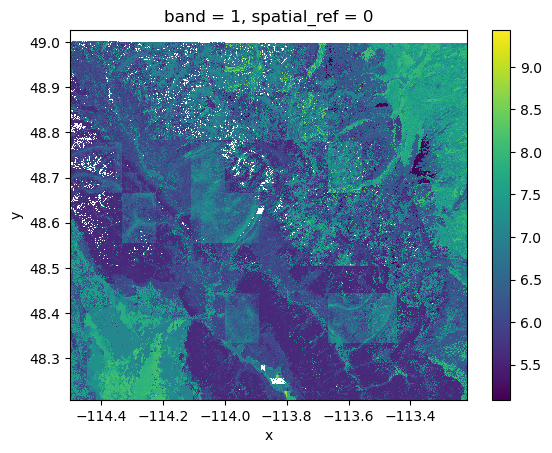

In [ ]:
# quick test plot
glacier_da.plot()

# this looks fine, and the Yellowstone and Mt. Rainier das won't have the invalid url issue

In [38]:
# Function to save rasters for later
def export_raster(da, raster_path, data_dir, no_data_val = -9999.0):
    '''
    Exports a DataArray to a GeoTIFF with a specific NoData value.

    Args:
    =====
    da (xarray.DataArray):
        Input raster array to be saved
    raster_path (str):
        Path to output directory
    data_dir (str):
        Output directory
    no_data_val (float):
        Value to be set for cells with no data

    Returns:
    ========
    None
    '''
    
    # skip if file already exists
    if os.path.exists(raster_path):
        print('Raster has already been exported')
        return

    # clear problematic attribute and encoding to avoid a conflict error
    da.attrs.pop('_FillValue', None)
    da.encoding.pop('_FillValue', None)

    # set the NoData value for the DataArray
    da.rio.write_nodata(no_data_val, inplace=True)

    # build output path
    output_file = os.path.join(data_dir, os.path.basename(raster_path))

    # export
    da.rio.to_raster(output_file, nodata = no_data_val)

In [33]:
# test export_raster

# paths
soil_raster_dir = Path(data_dir) / 'soil_rasters'
ys_ph_path = Path(soil_raster_dir) / 'glacier_ph.tif'
os.makedirs(soil_raster_dir, exist_ok=True)

#test
export_raster(glacier_da, ys_ph_path, soil_raster_dir)

In [29]:
# Define a plotting function
def plot_site(site_da, site_gdf, plots_dir, site_fig_name, plot_title,
              bar_label, plot_cmap, boundary_clr, tif_file = False):
    '''
    Function to create custom site plot
    
    Args:
    =====
    site_da (xarray.DataArray): 
        input site raster
    site_gdf (geopandas.GeoDataFrame): 
        input site gdf 
    plots_dir (str): 
        path to plot folder for saving plots
    site_fig_name (str): 
        site figure name
    plot_title (str):  
        plot title
    bar_label (str): 
        Plot bar variable name
    plot_cmap (str): 
        Colormap for plot
    boundary_clr (str): 
        Color for site boundary
    tif_file = False (Boolean): 
        Indicating if there is a site file to draw from

    Returns:
    matplotlib.pyplot.plot: a plot of site values
    '''

    # Set up figure
    fig = plt.figure(figsize = (8,6))
    ax = plt.axes()

    # Set up conditional
    if tif_file:
        site_da = rxr.open_rasterio(site_da, masked = True)

    # Plot DA values
    site_plot = site_da.plot(cmap = plot_cmap,
                             cbar_kwargs = {'label': bar_label})
    
    # Plot Site Boundary
    site_gdf.boundary.plot(ax = plt.gca(), color = boundary_clr)

    # Set title and labels
    plt.title(f'{plot_title}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

    # Save figure, named programmatically
    # can I use this to name climate model data?
    save_filename = f'{site_fig_name}.png'
    save_fig_path = os.path.join(plots_dir, save_filename)
    fig.savefig(save_fig_path, bbox_inches = 'tight') # bbox avoids clipping labels

    # Show the figure
    plt.show()
    plt.close(fig)
    return site_plot

In [26]:
# soil paths
soil_dir = Path(data_dir) / "soil"
os.makedirs(soil_dir, exist_ok=True)

soil_plots_dir = Path(soil_dir) / "plots"
os.makedirs(soil_plots_dir, exist_ok=True)

test_plot_path = Path(soil_plots_dir) / "glacier_pH_plot.png"

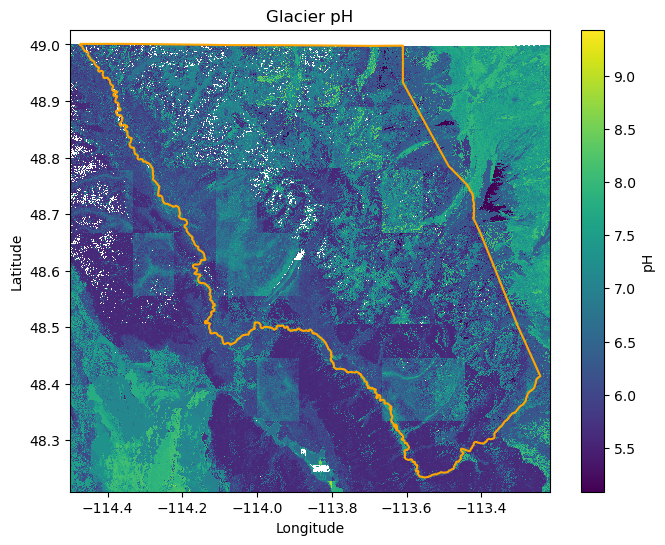

In [27]:
# test plot_site
plot_site(glacier_da, glacier_gdf, soil_plots_dir, "glacier_ph", 
          "Glacier pH", "pH", 'viridis', 'orange')

In [39]:
# Define wrapper function

def process_polaris_data(site_name, site_gdf, soil_prop, stat, soil_depth,
                         plot_path, plot_title, data_dir, plots_dir):
    '''docstring
    Retrieve POLARIS data, build DataArray, plot site, and export raster

    Args:
    =====
    site_name (str): site name, used to name exported raster file
    site_gdf (geopandas.GeoDataFrame):
        site boundary, used to set bounding box
    soil_prop (str):
    stat (str):
    soil_depth (str):
    plot_path (str):
        used to name plot file
    plot_title (str):
        plot title
    data_dir (str): 
        path to directory where rasters are saved
    plots_dir (str):
        path to directory where plots are saved

    Returns:
    ========
    xarray.DataArray:
        soil DataArray for given location

    '''
    # raster path
    raster_path = os.path.join(soil_dir, f"{site_name}_soil_{soil_prop}.tif")
    
    # Collect soil URLs
    site_polaris_urls = create_polaris_urls(soil_prop, stat, soil_depth, site_gdf.total_bounds)

    # Download rasters and create single merged raster
    site_soil_da = build_polaris_da(site_polaris_urls, site_gdf.total_bounds, raster_path)

    # Export as raster
    export_raster(site_soil_da, raster_path, data_dir, no_data_val=-9999.0)

    # Plot site
    plot_site(site_soil_da, site_gdf, plots_dir,
              f"{plot_path}-Soil", f"{site_name} Soil {soil_prop}",
              soil_prop, 'viridis', 'white')
    
    # return soil raster
    return site_soil_da

  0%|          | 0/4 [00:00<?, ?it/s]

Soil raster already downloaded!
Soil raster already downloaded!
Soil raster already downloaded!
Soil raster already downloaded!
Raster has already been exported


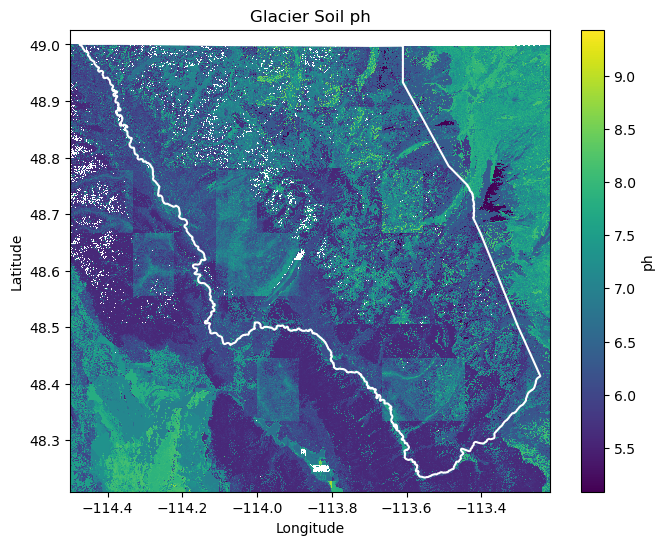

In [40]:
# test wrapper
soil_dir = Path(data_dir) / "soil"
os.makedirs(soil_dir, exist_ok=True)

soil_plots_dir = Path(soil_dir) / "plots"
os.makedirs(soil_plots_dir, exist_ok=True)

glacier_plot_path = Path(soil_plots_dir) / "glacier_pH_plot.png"

# glacier soil ph test
glacier_soil_da = process_polaris_data(
    site_name="Glacier", 
    site_gdf = glacier_gdf,
    soil_prop="ph", 
    stat = "mean", 
    soil_depth = "60_100",
    plot_path = glacier_plot_path, 
    plot_title = "Glacier pH",
    data_dir = soil_dir, 
    plots_dir = soil_plots_dir)

  0%|          | 0/6 [00:00<?, ?it/s]

Soil raster already downloaded!
Soil raster already downloaded!
Soil raster already downloaded!
Soil raster already downloaded!
Soil raster already downloaded!
Soil raster already downloaded!
Raster has already been exported


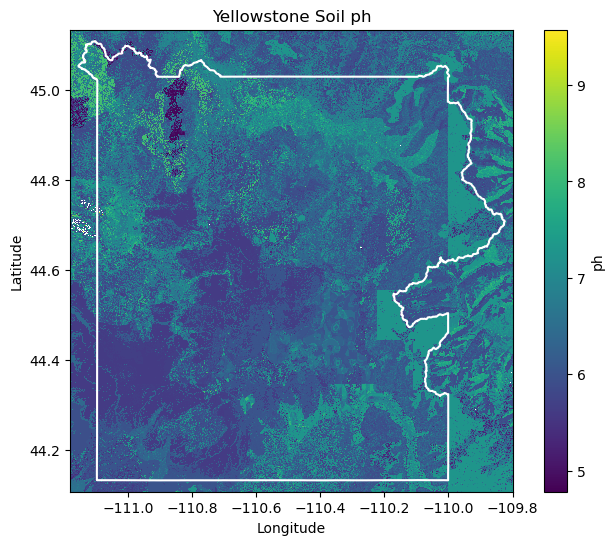

In [41]:
# Yellowstone

# set directories and paths
soil_dir = Path(data_dir) / "soil"
os.makedirs(soil_dir, exist_ok=True)
soil_plots_dir = Path(soil_dir) / "plots"
os.makedirs(soil_plots_dir, exist_ok=True)
yellowstone_plot_path = Path(soil_plots_dir) / "yellowstone_pH_plot.png"

# yellowstone soil ph test
yellowstone_soil_da = process_polaris_data(
    site_name="Yellowstone", 
    site_gdf = yellowstone_gdf,
    soil_prop="ph", 
    stat = "mean", 
    soil_depth = "60_100",
    plot_path = yellowstone_plot_path, 
    plot_title = "Yellowstone pH",
    data_dir = soil_dir, 
    plots_dir = soil_plots_dir)

  0%|          | 0/4 [00:00<?, ?it/s]

Soil raster already downloaded!
Soil raster already downloaded!
Soil raster already downloaded!
Soil raster already downloaded!
Raster has already been exported


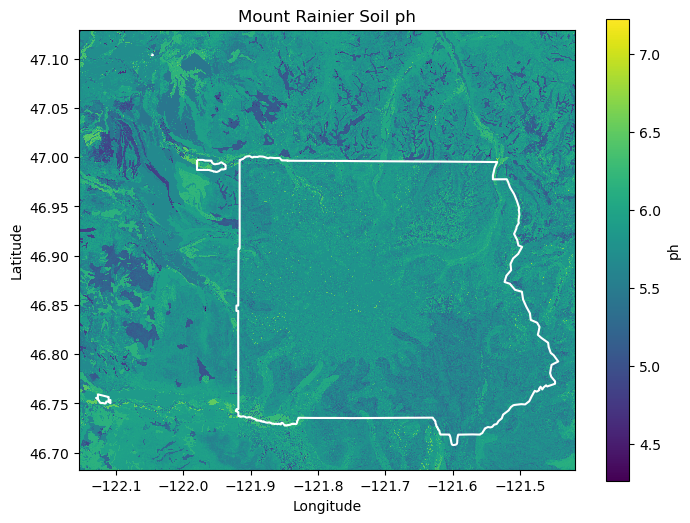

In [42]:
# Mount Rainier

# set directories and paths
soil_dir = Path(data_dir) / "soil"
os.makedirs(soil_dir, exist_ok=True)
soil_plots_dir = Path(soil_dir) / "plots"
os.makedirs(soil_plots_dir, exist_ok=True)
rainier_plot_path = Path(soil_plots_dir) / "rainier_pH_plot.png"

# rainier soil ph test
rainier_soil_da = process_polaris_data(
    site_name="Mount Rainier", 
    site_gdf = rainier_gdf,
    soil_prop="ph", 
    stat = "mean", 
    soil_depth = "60_100",
    plot_path = rainier_plot_path, 
    plot_title = "Mount Rainier pH",
    data_dir = soil_dir, 
    plots_dir = soil_plots_dir)

### Step 2b: Topographic data

Depending on your species habitat needs/environmental parameters, you might be interested in elevation, slope, and/or aspect. You can access reliable elevation data from the [SRTM
dataset](https://www.earthdata.nasa.gov/data/instruments/srtm),
available through the [earthaccess
API](https://earthaccess.readthedocs.io/en/latest/quick-start/). Once you have elevation data, you can calculate slope and aspect.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><p>Write a <strong>function with a numpy-style docstring</strong> that
will download SRTM elevation data for a particular location and
calculate any additional topographic variables you need such as slope or
aspect.</p>
<p>Then, use loops to download and organize the rasters you will need to
complete this section. Include topographic parameters that will help you
to answer your scientific question.</p></div></div>

> **Warning**
>
> Be careful when computing the slope from elevation that the units of
> elevation match the projection units (e.g. meters and meters, not
> meters and degrees). You will need to project the SRTM data to
> complete this calculation correctly.

Notes:
"In all but the driest regions, whitebark pine is most abundant on warm aspects and ridgetops having direct exposure to sun and wind. It is less abundant on sheltered, north-facing slopes and in cirque basins, where subalpine fir, Engelmann spruce (Picea engelmannii), mountain hemlock, or alpine larch (Larix lyallii) become prevalent. Nevertheless, the tallest and best formed whitebark pine trees are. often found in high basins or on gentle north slopes

It becomes increasingly abundant southward, especially in Montana and central Idaho. It is a major component of high-elevation forests and the timberline zone between about 1800 and 2500 m (5,900 and 8,200 ft) in northwestern Montana and 2130 and 2830 m (7,000 and 9,300 ft) in west-central Montana. In western Wyoming, it is abundant at 2440 to 3200 m (8,000 to 10,500 ft)." https://research.fs.usda.gov/silvics/whitebark-pine

In [43]:
# login to earthaccess

earthaccess.login()

INFO:You're now authenticated with NASA Earthdata Login


In [44]:
# Search for SRTM data

datasets = earthaccess.search_datasets(keyword = 'SRTM DEM')
for dataset in datasets:
    print(dataset['umm']['ShortName'], dataset['umm']['EntryTitle'])

INFO:Datasets found: 50


ICRAF_AfSIS_AfrHySRTM Africa Soil Information Service (AfSIS): Hydrologically Corrected/Adjusted SRTM DEM (AfrHySRTM)
NASADEM_SHHP NASADEM SRTM-only Height and Height Precision Mosaic Global 1 arc second V001
NASADEM_SIM NASADEM SRTM Image Mosaic Global 1 arc second V001
NASADEM_SSP NASADEM SRTM Subswath Global 1 arc second V001
USGS_OFR_2004_1322 Digital Shaded-Relief Map of Venezuela
C_Pools_Fluxes_CONUS_1837 CMS: Terrestrial Carbon Stocks, Emissions, and Fluxes for Conterminous US, 2001-2016
SRTMGL1 NASA Shuttle Radar Topography Mission Global 1 arc second V003
GEDI02_B GEDI L2B Canopy Cover and Vertical Profile Metrics Data Global Footprint Level V002
NASADEM_HGT NASADEM Merged DEM Global 1 arc second V001
SRTMGL3 NASA Shuttle Radar Topography Mission Global 3 arc second V003
GEDI01_B GEDI L1B Geolocated Waveform Data Global Footprint Level V002
NASADEM_NC NASADEM Merged DEM Global 1 arc second nc V001
SRTMGL1N NASA Shuttle Radar Topography Mission Global 1 arc second number V003
S

In [45]:
# Function to download SRTM elevation data
# I used Gemini to help me make this into a function.

def download_srtm_tiles(site_gdf, site_topo_dir, site_srtm_pattern):
    '''
    Searches for and downloads SRTMGL3 elevation data if not already present.

    Args:
    =====
    site_gdf (geopandas.GeoDataFrame): Study area boundary
    site_topo_dir (str/Path): Directory to save downloaded .hgt files
    site_srtm_pattern (str): Glob pattern (e.g., "data/topo/*.hgt") to check for existing data

    Returns:
    ========
    list: List of file paths for the SRTM data
    '''

    # study area
    site_elevation_bounds = site_gdf.total_bounds

    # add buffer
    buffer = 0.025
    xmin, ymin, xmax, ymax = site_gdf.total_bounds
    site_bounds_buffered = (xmin - buffer, ymin - buffer,
                            xmax + buffer, ymax + buffer)

    # open files if they have already been downloaded
    existing_files = glob(site_srtm_pattern)

    # look at results
    if not glob(site_srtm_pattern):

        # search for elevation data
        site_srtm_search = earthaccess.search_data(
            short_name = 'SRTMGL3',
            bounding_box = site_bounds_buffered
        )

        # download elevation data
        site_srtm_results = earthaccess.download(
            site_srtm_search,
            site_topo_dir
        )

        return site_srtm_results

    else:
        # site_srtm_results = open files
        print("SRTM Files have already been downloaded!")

        return existing_files

In [46]:
# test build srtm paths
topo_dir = os.path.join(data_dir, 'topo data')
os.makedirs(topo_dir, exist_ok=True)

# glacier dir
glacier_topo_dir = os.path.join(topo_dir, 'glacier')
os.makedirs(glacier_topo_dir, exist_ok=True)
glacier_srtm_pattern = os.path.join(glacier_topo_dir, '*.hgt.zip')

# test it out
glacier_topo_paths = download_srtm_tiles(glacier_gdf, glacier_topo_dir, glacier_srtm_pattern)
glacier_topo_paths

SRTM Files have already been downloaded!


['C:\\Users\\raini\\Documents\\Graduate_School\\EDA_Certificate\\Spring\\data\\habitat-suitability-climate-change\\topo data\\glacier\\N48W114.SRTMGL3.hgt.zip',
 'C:\\Users\\raini\\Documents\\Graduate_School\\EDA_Certificate\\Spring\\data\\habitat-suitability-climate-change\\topo data\\glacier\\N48W115.SRTMGL3.hgt.zip',
 'C:\\Users\\raini\\Documents\\Graduate_School\\EDA_Certificate\\Spring\\data\\habitat-suitability-climate-change\\topo data\\glacier\\N49W114.SRTMGL3.hgt.zip',
 'C:\\Users\\raini\\Documents\\Graduate_School\\EDA_Certificate\\Spring\\data\\habitat-suitability-climate-change\\topo data\\glacier\\N49W115.SRTMGL3.hgt.zip']

In [ ]:
# function to process elevation tiles
def merge_srtm_tiles(site_srtm_pattern, site_gdf):
    '''
    Merge downloaded SRTM tiles into one DA.

    Args:
    =====
    site_srtm_pattern (str):
        Helps define file paths to tiles.
    site_gdf (GeoDataFrame):
        Defines study area boundary for clipping

    Returns:
    ========
    site_srtm_da (DataArray):
        DA of merged srtm tiles
    '''
    
    # initialize list
    site_srtm_da_list = []

    # study area
    site_elevation_bounds = site_gdf.total_bounds

    # add buffer
    buffer = 0.025
    xmin, ymin, xmax, ymax = site_gdf.total_bounds
    site_bounds_buffered = (xmin - buffer, ymin - buffer,
                            xmax + buffer, ymax + buffer)

    # loop through tiles 
    for srtm_path in glob(site_srtm_pattern):
        tile_da = rxr.open_rasterio(srtm_path, mask_and_scale = True).squeeze()
        srtm_cropped_da = tile_da.rio.clip_box(*site_bounds_buffered)
        site_srtm_da_list.append(srtm_cropped_da)

    # merge the tiles
    site_srtm_da = merge_arrays(site_srtm_da_list)
    
    return site_srtm_da

In [48]:
# test glacier srtm tiles
glacier_srtm_da = merge_srtm_tiles(glacier_srtm_pattern, glacier_gdf)

<Axes: title={'center': 'band = 1, spatial_ref = 0'}, xlabel='x', ylabel='y'>

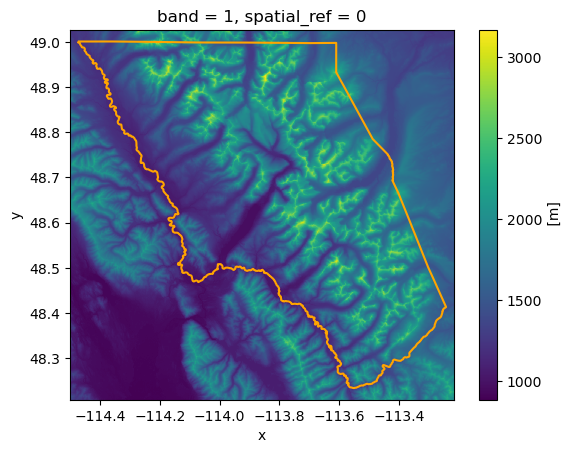

In [49]:
# Plot to check
glacier_srtm_da.plot()
glacier_gdf.boundary.plot(ax = plt.gca(), color='orange')

In [ ]:
# aspect
# I used Gemini to help me refine this function
def calculate_aspect(site_da, site_gdf):
    '''
    Calculates aspect using SRTM elevation data

    Args:
    =====
    site_da (DataArray):
        DA of SRTM elevation data
    site_gdf (GeoDataFrame):
        Defines study area boundary for clipping

    Returns:
    ========
    site_aspect_rpj (DataArray):
        DataArray of aspect data, reprojected to EPSG: 4326
    '''

    # label
    slope_reproject = site_da.rio.reproject("EPSG: 5070")

    # label
    site_aspect = xrspatial.aspect(slope_reproject)
    
    # need to cut values off at zero
    site_aspect = site_aspect.where(site_aspect > 0)

    # reproject slope to match gdf
    site_aspect_rpj = site_aspect.rio.reproject("EPSG: 4326")

    # clip data to ensure no dead space when plotting
    xmin, ymin, xmax, ymax = site_gdf.total_bounds
    site_aspect_rpj = site_aspect_rpj.rio.clip_box(xmin, ymin, xmax, ymax)

    # # plot aspect
    # ax = site_aspect_rpj.plot(cmap = 'twilight')

    # # show site boundary
    # site_gdf.boundary.plot(ax = plt.gca(), edgecolor = 'black')
    # plt.show()

    # return a da
    return site_aspect_rpj


In [52]:
# test aspect
glacier_aspect_da = calculate_aspect(glacier_srtm_da, glacier_gdf)

In [51]:
# slope calculation
def calculate_slope(site_da, site_gdf):
    '''
    Calculates slope using SRTM elevation data

    Args:
    =====
    site_da (DataArray):
        DA of SRTM elevation data
    site_gdf (GeoDataFrame):
        Defines study area boundary for clipping

    Returns:
    ========
    site_slope_rpj (DataArray):
        DataArray of slope data, reprojected to EPSG: 4326
    '''

    # label
    slope_reproject = site_da.rio.reproject("EPSG: 5070")

    # calculate slope
    site_slope = xrspatial.slope(slope_reproject)

    # reproject slope to match gdf
    site_slope_rpj = site_slope.rio.reproject("EPSG: 4326")

    # clip data to ensure no dead space when plotting
    xmin, ymin, xmax, ymax = site_gdf.total_bounds
    site_slope_rpj = site_slope_rpj.rio.clip_box(xmin, ymin, xmax, ymax)

    # # label
    # ax = site_slope_rpj.plot(cmap = 'terrain')
    # site_gdf.boundary.plot(ax = plt.gca(), edgecolor = 'black')
    # plt.show()

    # return a da
    return site_slope_rpj

In [ ]:
# test slope func
glacier_slope_da = calculate_slope(glacier_srtm_da, glacier_gdf)

In [53]:
# define a wrapper function
def process_srtm_data(site_name, site_gdf, site_srtm_pattern,
                      site_topo_dir, srtm_plots_dir):
    '''
    Function to download SRTM elevation tiles, process them, and calculate
    slope/aspect for study area.

    Args:
    =====
    site_name (str):
        Name of site, used for plotting and saving
    site_gdf (GeoDataFrame):
        Study area boundary, used to identify SRTM tiles and in plotting
    site_srtm_pattern (str):
        glob pattern used to identify files
    site_topo_dir (str):
        Directory to save downloaded tiles.
    srtm_plots_dir (str):
        Directory to save plots
    
    Returns:
    ========
    DataArray and plots of site elevation, slope and aspect
    '''

    # make if not statement to only process once
    
    # 1. Download tiles
    site_paths = download_srtm_tiles(site_gdf, site_topo_dir, site_srtm_pattern)

    # 2. Process tiles
    elevation_da = merge_srtm_tiles(site_srtm_pattern, site_gdf)

    # 3. Calculate aspect and slope
    aspect_da = calculate_aspect(elevation_da, site_gdf)
    slope_da = calculate_slope(elevation_da, site_gdf)

    # 4. Handle plotting
    # Dictionary to manage plotting parameters efficiently
    layers = {
        "elevation": (elevation_da, 'viridis', 'Elevation (meters)'),
        "slope": (slope_da, 'jet', 'Slope Angle (degrees)'),
        "aspect": (aspect_da, 'twilight', 'Aspect (degrees)')
    }

    # Create plots for each item
    for key, (da, cmap, cb_label) in layers.items():
        fig, ax = plt.subplots(figsize=(8, 6))
        
        # Plot the data
        im = da.plot(ax=ax, cmap=cmap, add_colorbar = True)
        
        # Overlay boundary
        site_gdf.boundary.plot(ax=ax, color='white', linewidth=1.5)
        
        # Labels and Titles
        ax.set_title(f"{site_name.title()} National Park {key.capitalize()}")
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        im.colorbar.set_label(cb_label)
        
        # Save to the specified plots directory
        plot_filename = f"{site_name}_{key}_plot.png"
        plt.savefig(os.path.join(srtm_plots_dir, plot_filename), bbox_inches='tight')

        # Show plot in Notebook
        plt.show()

        # Close figure in memory to aid performance
        plt.close(fig)
    
    return elevation_da, slope_da, aspect_da

SRTM Files have already been downloaded!


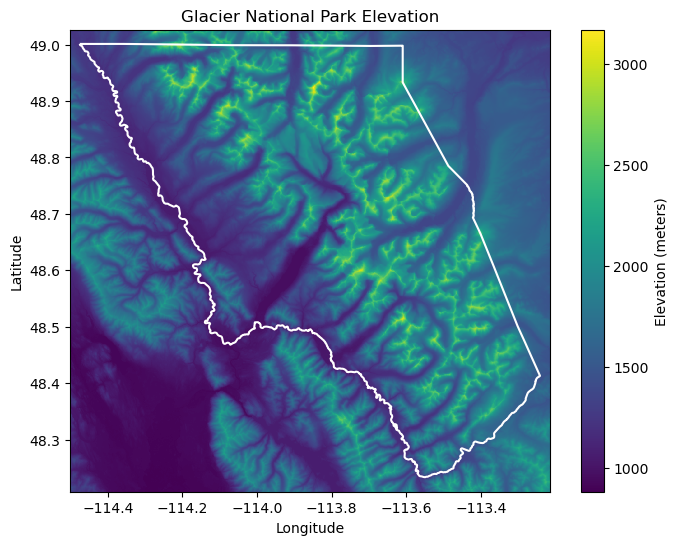

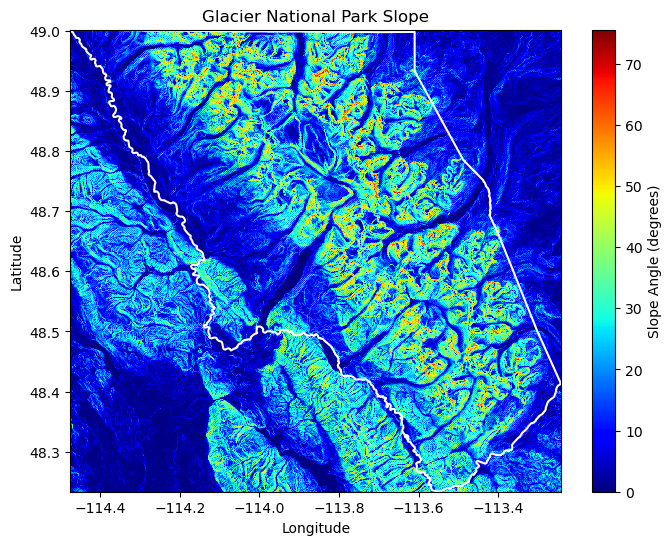

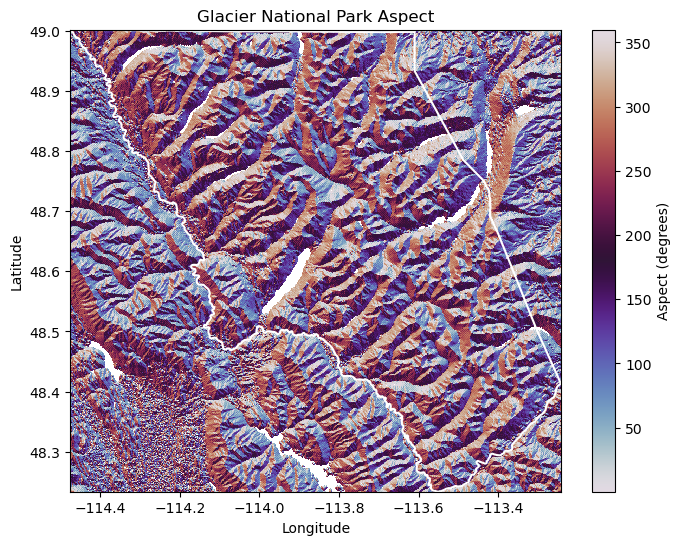

In [54]:
# test wrapper function

# set paths
srtm_plots_dir = os.path.join(topo_dir, 'plots')
os.makedirs(srtm_plots_dir, exist_ok=True)

# glacier dir
glacier_topo_dir = os.path.join(topo_dir, 'glacier')
os.makedirs(glacier_topo_dir, exist_ok=True)
glacier_srtm_pattern = os.path.join(glacier_topo_dir, '*.hgt.zip')

# Test the function
glacier_elevation_da, glacier_slope_da, glacier_aspect_da = process_srtm_data(
    site_name='glacier',
    site_gdf = glacier_gdf,
    site_srtm_pattern = glacier_srtm_pattern,
    site_topo_dir = glacier_topo_dir,
    srtm_plots_dir = srtm_plots_dir
)

SRTM Files have already been downloaded!


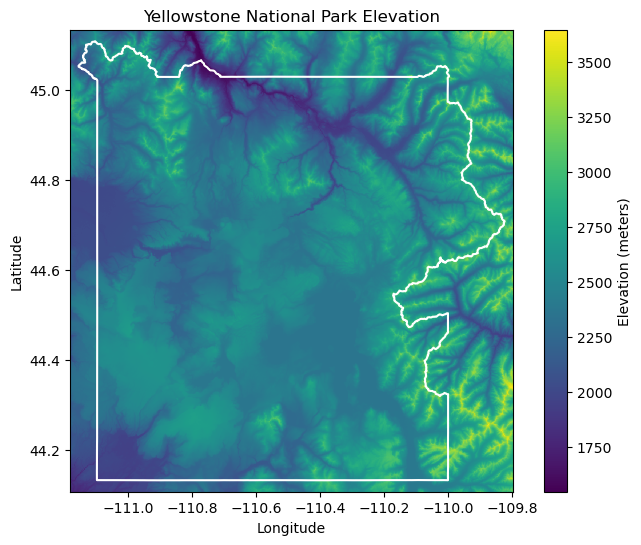

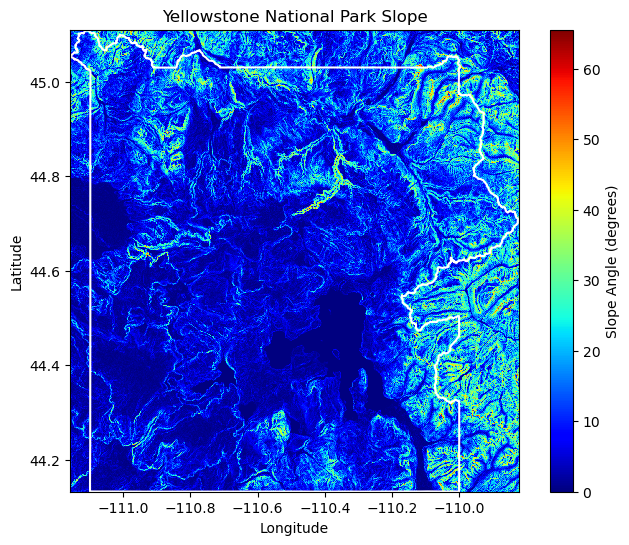

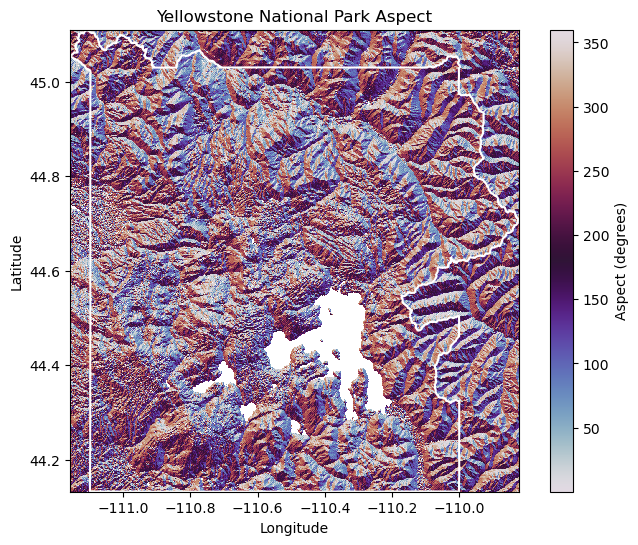

In [55]:
# Yellowstone

# set paths
srtm_plots_dir = os.path.join(topo_dir, 'plots')
os.makedirs(srtm_plots_dir, exist_ok=True)

# yellowstone dir
yellowstone_topo_dir = os.path.join(topo_dir, 'yellowstone')
os.makedirs(yellowstone_topo_dir, exist_ok=True)
yellowstone_srtm_pattern = os.path.join(yellowstone_topo_dir, '*.hgt.zip')

# Test the function
yellowstone_elevation_da, yellowstone_slope_da, yellowstone_aspect_da = process_srtm_data(
    site_name='yellowstone',
    site_gdf = yellowstone_gdf,
    site_srtm_pattern = yellowstone_srtm_pattern,
    site_topo_dir = yellowstone_topo_dir,
    srtm_plots_dir = srtm_plots_dir
)

SRTM Files have already been downloaded!


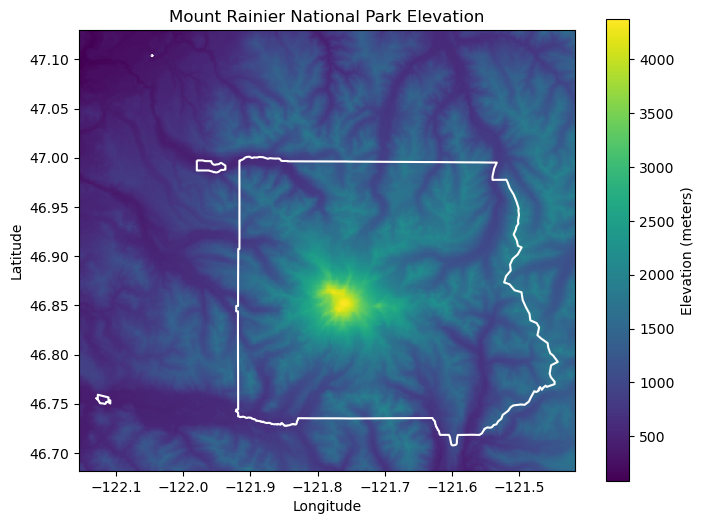

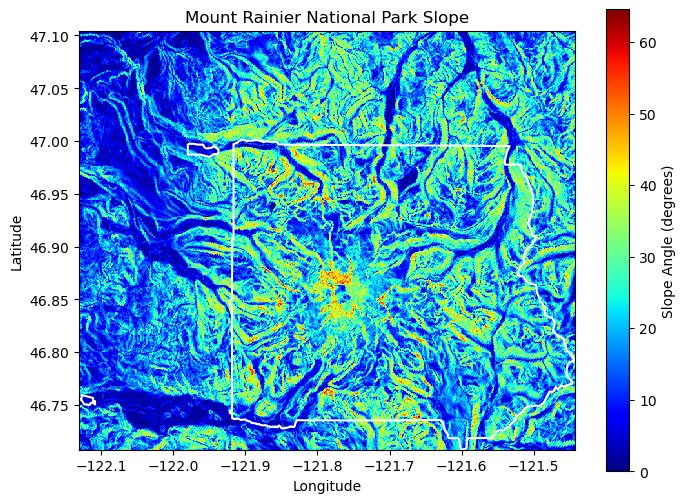

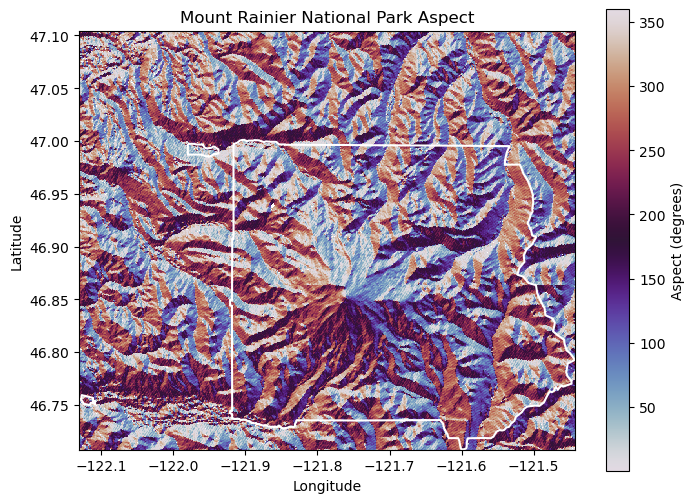

In [56]:
# Mt Rainier
# set paths
srtm_plots_dir = os.path.join(topo_dir, 'plots')
os.makedirs(srtm_plots_dir, exist_ok=True)

# rainier dir
rainier_topo_dir = os.path.join(topo_dir, 'rainier')
os.makedirs(rainier_topo_dir, exist_ok=True)
rainier_srtm_pattern = os.path.join(rainier_topo_dir, '*.hgt.zip')

# Test the function
rainier_elevation_da, rainier_slope_da, rainier_aspect_da = process_srtm_data(
    site_name='Mount Rainier',
    site_gdf = rainier_gdf,
    site_srtm_pattern = rainier_srtm_pattern,
    site_topo_dir = rainier_topo_dir,
    srtm_plots_dir = srtm_plots_dir
)

### Step 2c: Climate model data

You can use MACAv2 data for historical and future climate data. Be sure
to compare at least two 30-year time periods (e.g. historical vs. 10
years in the future) for at least four of the CMIP models. Overall, you
should be downloading at least 8 climate rasters for each of your sites,
for a total of 16. **You will *need* to use loops and/or functions to do
this cleanly!**.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><p>Write a <strong>function with a numpy-style docstring</strong> that
will download MACAv2 data for a particular climate model, emissions
scenario, spatial domain, and time frame. Then, use loops to download
and organize the 16+ rasters you will need to complete this section. The
<a
href="http://thredds.northwestknowledge.net:8080/thredds/reacch_climate_CMIP5_macav2_catalog2.html">MACAv2
dataset is accessible from their Thredds server</a>. Include an
arrangement of sites, models, emissions scenarios, and time periods that
will help you to answer your scientific question.</p></div></div>

Climate parameters:

- temp min: -58f
- temp max: 

https://research.fs.usda.gov/silvics/whitebark-pine
Summers are short and cool with mean July temperatures ranging from 13° to 15° C (55° to 59° F) in the whitebark pine forest and from 10° to 12° C (50° to 54° F) in the adjacent timberline zone. A cool growing season, as defined by mean temperatures higher than 5.5° C (42° F) (11), lasts about 90 to 110 days in the whitebark pine forest, but light frosts and snowfalls sometimes occur even in mid-summer. The hottest summer days reach temperatures of 26° to 30° C (79° to 86° F). January mean temperatures range from about -9° C (15° F) in Montana to about -5° C (23° F) in the Cascades and Sierra Nevada. Long-term record low temperatures in Montana and Wyoming stands are probably -40° to -50° C (-40° to -58° F)
Mean annual precipitation for most stands where whitebark pine is a major component probably is between 600 and 1800 mm (24 and 72 in)

[climate.northwestknowledge.net/MACA/data_portal.php](climate.northwestknowledge.net/MACA/data_portal.php)

go with monthly time frequency

In [57]:
# convert temp from Kelvin to F function
def convert_K_to_F(da):
    '''
    Converts an xarray DataArray from Kelvin to Fahrenheit 

    Args:
    da (DataArray):
        DA of temperature values
    '''

    # Perform conversion pixel-wise
    da_f = (da * 1.8) - 459.67
    
    return da_f

In [83]:
# Just convert longitude
def convert_longitude(longitude):

    '''
    This function cleans up datasets read from NetCDF files 
    in order to work with the other datasets used in this notebook.
    It converts lon from 0 to 360 to -180 to 180 

    Args:
    =====
    longitude (DataArray):
        DA from larger Dataset that contains longitude data

    Returns:
    ========
    longitude (DataArray)
    '''

    return longitude - 360 if longitude > 180 else longitude 

In [ ]:
# define some parameters

site_name = "site name"
site_gdf = site_gdf
date_range = "2041_2045" # need to be able to programmatically loop through these date ranges; maybe a list?
model = "model name, eg CanESM2" # make this a list
rcp_value = "pick an rcp"
variable = "pick a variable"

In [61]:
# test some parameters

site_name = "glacier"
site_gdf = glacier_gdf
date_range = "2041_2045" # need to be able to programmatically loop through these date ranges; maybe a list?
model = "GFDL-ESM2M" # make this a list
rcp_value = "rcp85"
variable = "tasmax"

In [76]:
# data dir for climate data

maca_dir = os.path.join(data_dir, 'maca_data')
os.makedirs(maca_dir, exist_ok = True)

# pattern
maca_pattern = os.path.join(maca_dir, '*.nc')
print(maca_pattern)

# path
maca_path = os.path.join(
    maca_dir, 
    f'maca_{model}_{site_name}_{rcp_value}_{date_range}_CONUS_monthly.nc')
print(maca_path)

C:\Users\raini\Documents\Graduate_School\EDA_Certificate\Spring\data\habitat-suitability-climate-change\maca_data\*.nc
C:\Users\raini\Documents\Graduate_School\EDA_Certificate\Spring\data\habitat-suitability-climate-change\maca_data\maca_GFDL-ESM2M_glacier_rcp85_2041_2045_CONUS_monthly.nc


In [77]:
# construct some URLs
maca_url = (
    'http://thredds.northwestknowledge.net:8080/thredds/dodsC'
    '/MACAV2'
    f'/{model}'
    f'/macav2metdata_{variable}'
    f'_{model}_r1i1p1'
    f'_{rcp_value}'
    f'_{date_range}_CONUS'
    '_monthly.nc'
)
maca_url

'http://thredds.northwestknowledge.net:8080/thredds/dodsC/MACAV2/GFDL-ESM2M/macav2metdata_tasmax_GFDL-ESM2M_r1i1p1_rcp85_2041_2045_CONUS_monthly.nc'

In [78]:
# download data once
if not os.path.exists(maca_path):

    # open remote dataset
    maca_da = xr.open_dataset(maca_url).squeeze() # may change based on variable

    # save locally
    maca_da.to_netcdf(maca_path)
    print(f"{model}, {date_range}, {rcp_value} downloaded successfully!")

else:
    print(f"{model}, {date_range}, {rcp_value} already exists")

GFDL-ESM2M, 2041_2045, rcp85 already exists


download one, visually inspect

In [82]:
# reproject 
glacier_rpj_gdf = glacier_gdf.to_crs(maca_da.rio.crs)

# get bounds
maca_bounds = glacier_rpj_gdf.total_bounds

# reassign lon
maca_da = maca_da.assign_coords(
    lon = ('lon', [convert_longitude(l) for l in maca_da.lon.values])
)

# set spatial dimension to define da as spatial
maca_da = maca_da.rio.set_spatial_dims(
    x_dim = 'lon',
    y_dim = 'lat'
)

# crop to bounding box
maca_da_crop = maca_da.rio.clip_box(*maca_bounds)

In [84]:
# store metadata
result = dict(
    site_name = site_name,
    climate_model = model,
    date_range = date_range,
    da = maca_da_crop
)

build blocks up into a function

In [179]:
# Function to download model data and process it
def download_and_process_maca_data(
        site_gdf, site_name,
        models, rcp_value,
        variable, year_range,
        maca_dir
):
    '''
    Downloads and processes MACA data for a given site.
    Processing includes clipping bounds and rewriting longitude values
    
    Args:
    =====
    site_gdf (geopandas.GeoDataFrame):
        Site boundary, used for clipping
    site_name (str):
        Name of site
    models (list):
        List of models to programmatically download
    rcp_value (str):
        RCP value for MACA url
    variable (str):
        Variable of interest
    year_range (str):
        Range of years to be downloaded
    maca_dir (str):
        Path for data to be saved
    '''

    # Initialize results list
    results = []

    # count total steps for progress bar
    total_steps = len(models) * len(year_range)

    # download and process files
    with tqdm(total=total_steps, desc=f"Processing {site_name}") as pbar:
        # loop through models
        for model in models:

            # hold onto each time chunk for aggregation at the end
            model_chunks = []
            # loop through year chunks
            for years in year_range:

                # Programmatically determine file path and download url
                file_name = f'maca_{model}_{site_name}_{rcp_value}_{years}_CONUS_monthly.nc'
                maca_path = os.path.join(maca_dir, file_name)
                maca_url = (
                    f'http://thredds.northwestknowledge.net:8080/thredds/dodsC/MACAV2/{model}/'
                    f'macav2metdata_{variable}_{model}_r1i1p1_{rcp_value}_{years}_CONUS_monthly.nc'
                )
                

                # Download or open file
                if not os.path.exists(maca_path):
                    print(f"{model}, {years}, {rcp_value} downloaded successfully!")
                    maca_ds = xr.open_dataset(maca_url, mask_and_scale = True).squeeze()
                    maca_ds.to_netcdf(maca_path)
                else:
                    print(f"{model}, {years}, {rcp_value} already exists")
                    maca_ds = xr.open_dataset(maca_path, mask_and_scale = True).squeeze()

                # Convert longitude
                # reassign lon
                maca_ds = maca_ds.assign_coords(
                    lon = ('lon', [convert_longitude(l) for l in maca_ds.lon.values])
                )

                # set crs
                maca_ds = maca_ds.rio.write_crs('EPSG:4326')
                
                # set spatial dimension to define da as spatial
                maca_ds = maca_ds.rio.set_spatial_dims(
                    x_dim = 'lon',
                    y_dim = 'lat'
                )

                # set site bounds
                site_rpj = site_gdf.to_crs(maca_ds.rio.crs)
                site_bounds = site_rpj.total_bounds

                # write no data as NaN
                maca_ds['air_temperature'].rio.write_nodata(np.nan, inplace=True)

                # crop to bounding box
                maca_ds_crop = maca_ds.rio.clip_box(*site_bounds)
                
                # Append this specific 5-year chunk to the model list
                model_chunks.append(maca_ds_crop)

                # Update progress bar
                pbar.update(1)

            # Combine all year chunks for this model into one Dataset
            combined_model_ds = xr.concat(model_chunks, dim='time')
            
            # Convert temperature
            combined_model_ds['air_temperature'] = convert_K_to_F(combined_model_ds['air_temperature'])

            # Mask No Data values for mean
            valid_data = combined_model_ds.where(combined_model_ds > -100)

            # Calculate the mean across the time dimension
            mean_model_ds = valid_data.mean(dim='time')

            # convert to DataArray
            mean_model_da = mean_model_ds['air_temperature']

            # rewrite NaN values
            mean_model_da.rio.write_nodata(np.nan, inplace=True)
            
            # store data
            results.append({
                'site_name': site_name,
                'model': model,
                'rcp_value': rcp_value,
                'variable': variable,
            #    'date_range': years,
                'data': mean_model_da
            })
            
    return results

In [167]:
# test some parameters

site_name = "glacier"
site_gdf = glacier_gdf
date_range = "2041_2045" # need to be able to programmatically loop through these date ranges; maybe a list?
model = "GFDL-ESM2M" # make this a list
rcp_value = "rcp85"
variable = "tasmax"

# glacier future
glacier_future = download_and_process_maca_data(
    glacier_gdf,
    'glacier',
    [model],
    rcp_value,
    variable,
    [date_range],
    maca_dir
)
glacier_future


Processing glacier:   0%|          | 0/1 [00:00<?, ?it/s]

GFDL-ESM2M, 2041_2045, rcp85 already exists


[{'site_name': 'glacier',
  'model': 'GFDL-ESM2M',
  'rcp_value': 'rcp85',
  'variable': 'tasmax',
  'data': <xarray.DataArray 'air_temperature' (lat: 20, lon: 31)> Size: 2kB
  array([[55.30048 , 56.376003, 57.1498  , 57.236515, 57.296482, 57.197655,
          57.00307 , 56.784485, 56.55738 , 55.574505, 50.150036, 46.32391 ,
          48.54757 , 48.256676, 49.266556, 53.704082, 54.739334, 52.42204 ,
          45.524704, 46.626774, 46.806946, 50.14778 , 51.860683, 48.47008 ,
          47.73753 , 47.211494, 46.955402, 47.92025 , 47.91808 , 46.340958,
          44.775967],
         [56.0111  , 56.86324 , 56.978813, 56.92961 , 56.743973, 56.749577,
          56.87561 , 56.958454, 56.734863, 48.950054, 46.87759 , 48.463867,
          49.732773, 52.46328 , 53.961105, 54.408096, 54.140537, 47.59996 ,
          44.746677, 47.362804, 50.301994, 53.036503, 49.060513, 46.822823,
          49.254223, 51.27277 , 49.04925 , 47.777176, 45.879185, 46.387737,
          47.59789 ],
         [56.424625, 

In [91]:
# define year chunks
historic_range = ['1970_1974', '1975_1979', '1980_1984', 
                  '1985_1989', '1990_1994', '1995_1999']
future_range = ['2036_2040', '2041_2045', '2046_2050', 
                '2051_2055', '2056_2060', '2061_2065']

# define models
park_models = {
    "glacier": [
        "MRI-CGCM3", "GFDL-ESM2M", "HadGEM2-CC365", "HadGEM2-ES365"],
    "yellowstone": [
        "IPSL-CM5B-LR", "MRI-CGCM3", "HadGEM2-ES365", "MIROC-ESM-CHEM"],
    "rainier": [
        "MRI-CGCM3", "GFDL-ESM2M", "HadGEM2-CC365", "CanESM2"]
}

In [168]:
# test full function w/ glacier historic
glacier_models = ['MRI-CGCM3', 'GFDL-ESM2M', 'HadGEM2-CC365', 'HadGEM2-ES365']

glacier_historic_results = download_and_process_maca_data(
    site_gdf = glacier_gdf,
    site_name = "Glacier",
    models = park_models['glacier'],
    rcp_value = 'historical', 
    variable = 'tasmax',
    year_range = historic_range,
    maca_dir = maca_dir
)

Processing Glacier:   0%|          | 0/24 [00:00<?, ?it/s]

MRI-CGCM3, 1970_1974, historical already exists
MRI-CGCM3, 1975_1979, historical already exists
MRI-CGCM3, 1980_1984, historical already exists
MRI-CGCM3, 1985_1989, historical already exists
MRI-CGCM3, 1990_1994, historical already exists
MRI-CGCM3, 1995_1999, historical already exists
GFDL-ESM2M, 1970_1974, historical already exists
GFDL-ESM2M, 1975_1979, historical already exists
GFDL-ESM2M, 1980_1984, historical already exists
GFDL-ESM2M, 1985_1989, historical already exists
GFDL-ESM2M, 1990_1994, historical already exists
GFDL-ESM2M, 1995_1999, historical already exists
HadGEM2-CC365, 1970_1974, historical already exists
HadGEM2-CC365, 1975_1979, historical already exists
HadGEM2-CC365, 1980_1984, historical already exists
HadGEM2-CC365, 1985_1989, historical already exists
HadGEM2-CC365, 1990_1994, historical already exists
HadGEM2-CC365, 1995_1999, historical already exists
HadGEM2-ES365, 1970_1974, historical already exists
HadGEM2-ES365, 1975_1979, historical already exists
Ha

In [169]:
# glacier future
glacier_future_results = download_and_process_maca_data(
    site_gdf = glacier_gdf,
    site_name = "Glacier",
    models = park_models['glacier'],
    rcp_value = 'rcp85', 
    variable = 'tasmax',
    year_range = future_range,
    maca_dir = maca_dir
)

Processing Glacier:   0%|          | 0/24 [00:00<?, ?it/s]

MRI-CGCM3, 2036_2040, rcp85 already exists
MRI-CGCM3, 2041_2045, rcp85 already exists
MRI-CGCM3, 2046_2050, rcp85 already exists
MRI-CGCM3, 2051_2055, rcp85 already exists
MRI-CGCM3, 2056_2060, rcp85 already exists
MRI-CGCM3, 2061_2065, rcp85 already exists
GFDL-ESM2M, 2036_2040, rcp85 already exists
GFDL-ESM2M, 2041_2045, rcp85 already exists
GFDL-ESM2M, 2046_2050, rcp85 already exists
GFDL-ESM2M, 2051_2055, rcp85 already exists
GFDL-ESM2M, 2056_2060, rcp85 already exists
GFDL-ESM2M, 2061_2065, rcp85 already exists
HadGEM2-CC365, 2036_2040, rcp85 already exists
HadGEM2-CC365, 2041_2045, rcp85 already exists
HadGEM2-CC365, 2046_2050, rcp85 already exists
HadGEM2-CC365, 2051_2055, rcp85 already exists
HadGEM2-CC365, 2056_2060, rcp85 already exists
HadGEM2-CC365, 2061_2065, rcp85 already exists
HadGEM2-ES365, 2036_2040, rcp85 already exists
HadGEM2-ES365, 2041_2045, rcp85 already exists
HadGEM2-ES365, 2046_2050, rcp85 already exists
HadGEM2-ES365, 2051_2055, rcp85 already exists
HadGEM2-

In [96]:
# Yellowstone historic
yellowstone_historic_results = download_and_process_maca_data(
    site_gdf = yellowstone_gdf,
    site_name = "Yellowstone",
    models = park_models['yellowstone'],
    rcp_value = 'historical', 
    variable = 'tasmax',
    year_range = historic_range,
    maca_dir = maca_dir
)

Processing Yellowstone:   0%|          | 0/24 [00:00<?, ?it/s]

IPSL-CM5B-LR, 1970_1974, historical already exists
IPSL-CM5B-LR, 1975_1979, historical already exists
IPSL-CM5B-LR, 1980_1984, historical already exists
IPSL-CM5B-LR, 1985_1989, historical already exists
IPSL-CM5B-LR, 1990_1994, historical already exists
IPSL-CM5B-LR, 1995_1999, historical already exists
MRI-CGCM3, 1970_1974, historical already exists
MRI-CGCM3, 1975_1979, historical already exists
MRI-CGCM3, 1980_1984, historical already exists
MRI-CGCM3, 1985_1989, historical already exists
MRI-CGCM3, 1990_1994, historical already exists
MRI-CGCM3, 1995_1999, historical already exists
HadGEM2-ES365, 1970_1974, historical already exists
HadGEM2-ES365, 1975_1979, historical already exists
HadGEM2-ES365, 1980_1984, historical already exists
HadGEM2-ES365, 1985_1989, historical already exists
HadGEM2-ES365, 1990_1994, historical already exists
HadGEM2-ES365, 1995_1999, historical already exists
MIROC-ESM-CHEM, 1970_1974, historical already exists
MIROC-ESM-CHEM, 1975_1979, historical alr

In [97]:
# yellowstone future
yellowstone_future_results = download_and_process_maca_data(
    site_gdf = yellowstone_gdf,
    site_name = "Yellowstone",
    models = park_models['yellowstone'],
    rcp_value = 'rcp85', 
    variable = 'tasmax',
    year_range = future_range,
    maca_dir = maca_dir
)

Processing Yellowstone:   0%|          | 0/24 [00:00<?, ?it/s]

IPSL-CM5B-LR, 2036_2040, rcp85 already exists
IPSL-CM5B-LR, 2041_2045, rcp85 already exists
IPSL-CM5B-LR, 2046_2050, rcp85 already exists
IPSL-CM5B-LR, 2051_2055, rcp85 already exists
IPSL-CM5B-LR, 2056_2060, rcp85 already exists
IPSL-CM5B-LR, 2061_2065, rcp85 already exists
MRI-CGCM3, 2036_2040, rcp85 already exists
MRI-CGCM3, 2041_2045, rcp85 already exists
MRI-CGCM3, 2046_2050, rcp85 already exists
MRI-CGCM3, 2051_2055, rcp85 already exists
MRI-CGCM3, 2056_2060, rcp85 already exists
MRI-CGCM3, 2061_2065, rcp85 already exists
HadGEM2-ES365, 2036_2040, rcp85 already exists
HadGEM2-ES365, 2041_2045, rcp85 already exists
HadGEM2-ES365, 2046_2050, rcp85 already exists
HadGEM2-ES365, 2051_2055, rcp85 already exists
HadGEM2-ES365, 2056_2060, rcp85 already exists
HadGEM2-ES365, 2061_2065, rcp85 already exists
MIROC-ESM-CHEM, 2036_2040, rcp85 already exists
MIROC-ESM-CHEM, 2041_2045, rcp85 already exists
MIROC-ESM-CHEM, 2046_2050, rcp85 already exists
MIROC-ESM-CHEM, 2051_2055, rcp85 already

In [180]:
# Rainier historic
rainier_historic_results = download_and_process_maca_data(
    site_gdf = rainier_gdf,
    site_name = "rainier",
    models = park_models['rainier'],
    rcp_value = 'historical', 
    variable = 'tasmax',
    year_range = historic_range,
    maca_dir = maca_dir
)

Processing rainier:   0%|          | 0/24 [00:00<?, ?it/s]

MRI-CGCM3, 1970_1974, historical downloaded successfully!
MRI-CGCM3, 1975_1979, historical downloaded successfully!
MRI-CGCM3, 1980_1984, historical downloaded successfully!
MRI-CGCM3, 1985_1989, historical downloaded successfully!
MRI-CGCM3, 1990_1994, historical downloaded successfully!
MRI-CGCM3, 1995_1999, historical downloaded successfully!
GFDL-ESM2M, 1970_1974, historical downloaded successfully!
GFDL-ESM2M, 1975_1979, historical downloaded successfully!
GFDL-ESM2M, 1980_1984, historical downloaded successfully!
GFDL-ESM2M, 1985_1989, historical downloaded successfully!
GFDL-ESM2M, 1990_1994, historical downloaded successfully!
GFDL-ESM2M, 1995_1999, historical downloaded successfully!
HadGEM2-CC365, 1970_1974, historical downloaded successfully!
HadGEM2-CC365, 1975_1979, historical downloaded successfully!
HadGEM2-CC365, 1980_1984, historical downloaded successfully!
HadGEM2-CC365, 1985_1989, historical downloaded successfully!
HadGEM2-CC365, 1990_1994, historical downloaded su

In [181]:
# rainier future
rainier_future_results = download_and_process_maca_data(
    site_gdf = rainier_gdf,
    site_name = "rainier",
    models = park_models['rainier'],
    rcp_value = 'rcp85', 
    variable = 'tasmax',
    year_range = future_range,
    maca_dir = maca_dir
)

Processing rainier:   0%|          | 0/24 [00:00<?, ?it/s]

MRI-CGCM3, 2036_2040, rcp85 downloaded successfully!
MRI-CGCM3, 2041_2045, rcp85 downloaded successfully!
MRI-CGCM3, 2046_2050, rcp85 downloaded successfully!
MRI-CGCM3, 2051_2055, rcp85 downloaded successfully!
MRI-CGCM3, 2056_2060, rcp85 downloaded successfully!
MRI-CGCM3, 2061_2065, rcp85 downloaded successfully!
GFDL-ESM2M, 2036_2040, rcp85 downloaded successfully!
GFDL-ESM2M, 2041_2045, rcp85 downloaded successfully!
GFDL-ESM2M, 2046_2050, rcp85 downloaded successfully!
GFDL-ESM2M, 2051_2055, rcp85 downloaded successfully!
GFDL-ESM2M, 2056_2060, rcp85 downloaded successfully!
GFDL-ESM2M, 2061_2065, rcp85 downloaded successfully!
HadGEM2-CC365, 2036_2040, rcp85 downloaded successfully!
HadGEM2-CC365, 2041_2045, rcp85 downloaded successfully!
HadGEM2-CC365, 2046_2050, rcp85 downloaded successfully!
HadGEM2-CC365, 2051_2055, rcp85 downloaded successfully!
HadGEM2-CC365, 2056_2060, rcp85 downloaded successfully!
HadGEM2-CC365, 2061_2065, rcp85 downloaded successfully!
CanESM2, 2036_20

**Reflect and respond**: Make sure to include a description of the climate data and how you selected your models. Include a citation of the MACAv2 data.

Your response here:

## STEP 3: Harmonize data
To use all your environmental and climate data layers together, you need to harmonize the different rasters you've downloaded and processed. 

As a first step, make sure that the grids for all the rasters match each other. Check out the <a href="https://corteva.github.io/rioxarray/stable/examples/reproject_match.html#Reproject-Match"><code>ds.rio.reproject_match()</code> method</a> from <code>rioxarray</code>. Make sure to use the data source that has the highest resolution as a template!</p></div></div>

> **Warning**
>
> If you are reprojecting data (as you need to here), the order of
> operations is important! Recall that reprojecting will typically tilt
> your data, leaving narrow sections of the data at the edge blank.
> However, to reproject efficiently it is best for the raster to be as
> small as possible before performing the operation. We recommend the
> following process:
>
>     1. Crop the data, leaving a buffer around the final boundary
>     2. Reproject to match the template grid (this will also crop any leftovers off the image)

In [5]:
### Align the grids of the different data layers

In [ ]:
# Function to ensure that all layers have same bounds
# I used Gemini to help me refine thie function.
def ensure_spatial_homogeneity(site_name, site_gdf,
                               site_soil_da,
                               site_srtm_da, site_slope_da, site_aspect_da,
                               site_climate_list,
                               raster_dir, time_period, variables):
    ''' 
    This function ensures all layers have the same spatial bounds.

    Args:
    =====
    site_name (str):
        Name of site
    site_gdf (GeoDataFrame):
        Site Boundary
    site_soil_da (DataArray):
        DA of soil data
    site_srtm_da (DataArray):
        DA of elevation
    site_slope_da (DataArray):
        DA of slope
    site_aspect_da (DataArray):
        DA of aspect
    site_climate_list (list):
        List of model DAs
    raster_dir (str):
        Directory for raster export
    time_period (str): 
        Historic or future
    variables (str):
        Variable of interest
    '''

    # make a list of layers we have
    site_das_list = [
        site_soil_da,
        site_srtm_da,
        site_slope_da,
        site_aspect_da,
    ]

    # define boundaries
    site_bounds = tuple(site_gdf.total_bounds)

    # add a buffer
    buffer = 0.025
    (site_xmin, site_ymin, site_xmax, site_ymax) = site_bounds

    # could use a buffer command, investigate
    site_bounds_buffer = (site_xmin - buffer,
                        site_ymin - buffer,
                        site_xmax + buffer,
                        site_ymax + buffer)
    # initialize empty list for cropped and reprojected data arrays
    rpj_da_list = []

    # loop through static DAs
    for da, variable in zip(site_das_list, variables):
    
            # crop and reproject da
            cropped_da = da.rio.clip_box(*site_bounds_buffer)
            reproj_da = (cropped_da.rio.reproject_match(site_das_list[0]))

            # add to list
            rpj_da_list.append(reproj_da)

            # save rasters to file
            raster_path = os.path.join(raster_dir, f'{site_name}_{variable}.tif')
            export_raster(reproj_da, raster_path, raster_dir, no_data_val=-9999.0)

    for dict in site_climate_list:
        # extract DA from dictionary
        da = dict['data'].squeeze()
        # Get the model name from the DataArray attributes (set during download)
        model_id = dict.get('model')
        
        # Clip climate data
        clipped_climate = da.rio.clip_box(*site_bounds_buffer)
        clipped_climate.name = f"{site_name}_tmax_{model_id}"
        
        # append to da
        rpj_da_list.append(clipped_climate)

        # save to file
        raster_path = os.path.join(raster_dir, f'{site_name}_tmax_{model_id}_{time_period}.tif')
        export_raster(clipped_climate, raster_path, raster_dir, no_data_val=-9999.0)

    return rpj_da_list


test this func

In [182]:
# set variable names, raster directory, and site names
variables = ['ph', 'elevation', 'slope', 'aspect']

# directory
raster_dir = os.path.join(data_dir, 'rasters')
os.makedirs(raster_dir, exist_ok=True)

# site names
yellowstone_soil_da.name = 'yellowstone ph'
yellowstone_elevation_da.name = 'yellowstone elevation'
yellowstone_aspect_da.name = 'yellowstone aspect'
yellowstone_slope_da.name = 'yellowstone slope'

glacier_soil_da.name = 'glacier ph'
glacier_elevation_da.name = 'glacier elevation'
glacier_aspect_da.name = 'glacier aspect'
glacier_slope_da.name = 'glacier slope'

rainier_soil_da.name = 'rainier ph'
rainier_elevation_da.name = 'rainier elevation'
rainier_aspect_da.name = 'rainier aspect'
rainier_slope_da.name = 'rainier slope'

In [171]:
# glacier
glacier_hist_rpj_das = ensure_spatial_homogeneity('glacier', glacier_gdf,
                                         glacier_soil_da, 
                                         glacier_elevation_da, glacier_slope_da, glacier_aspect_da, 
                                         glacier_historic_results,
                                         raster_dir, 'historic', variables)

glacier_fut_rpj_das = ensure_spatial_homogeneity('glacier', glacier_gdf,
                                         glacier_soil_da, 
                                         glacier_elevation_da, glacier_slope_da, glacier_aspect_da, 
                                         glacier_future_results,
                                         raster_dir, 'future', variables)


Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported


In [183]:
# yellowstone
yellowstone_hist_rpj_das = ensure_spatial_homogeneity('yellowstone', yellowstone_gdf,
                                         yellowstone_soil_da, 
                                         yellowstone_elevation_da, yellowstone_slope_da, yellowstone_aspect_da, 
                                         yellowstone_historic_results,
                                         raster_dir, 'historic', variables)


yellowstone_fut_rpj_das = ensure_spatial_homogeneity('yellowstone', yellowstone_gdf,
                                         yellowstone_soil_da, 
                                         yellowstone_elevation_da, yellowstone_slope_da, yellowstone_aspect_da, 
                                         yellowstone_future_results,
                                         raster_dir, 'future', variables)


Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported


In [184]:
# rainier
rainier_hist_rpj_das = ensure_spatial_homogeneity('rainier', rainier_gdf,
                                         rainier_soil_da, 
                                         rainier_elevation_da, rainier_slope_da, rainier_aspect_da, 
                                         rainier_historic_results,
                                         raster_dir, 'historic', variables)


rainier_fut_rpj_das = ensure_spatial_homogeneity('rainier', rainier_gdf,
                                         rainier_soil_da, 
                                         rainier_elevation_da, rainier_slope_da, rainier_aspect_da, 
                                         rainier_future_results,
                                         raster_dir, 'future', variables)


c:\Users\raini\miniconda3\envs\earth-analytics-python\Lib\site-packages\xarray\core\duck_array_ops.py:250: RuntimeWarning: invalid value encountered in cast
  return data.astype(dtype, **kwargs)


Raster has already been exported
Raster has already been exported
Raster has already been exported
Raster has already been exported


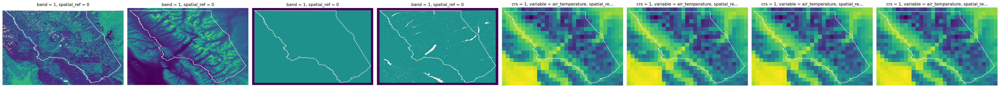

In [ ]:
# make some subplots to check that the harmonizing function worked
# I used Gemini to help me refine this.
# pseudocode right now
fig, axes = plt.subplots(1, len(glacier_fut_rpj_das),
                         figsize = (5*len(glacier_fut_rpj_das), 5))

# make this more reproducible
if len(glacier_fut_rpj_das) == 1:
    axes = [axes]

for ax, data in zip(axes, glacier_fut_rpj_das):

    # drop band dimension
    if data.ndim == 3:
        data = data.squeeze()

    # plot
    data.plot(ax = ax, cmap = 'viridis', add_colorbar = False)

    # add site boundary to plot
    site_gdf.plot(ax = ax, facecolor = 'none',
                  edgecolor = 'white', linewidth = 1)
    
    # align axes
    ax.set_aspect('equal')
    ax.set_axis_off()

plt.tight_layout()
plt.show()


In [106]:
# function to grab file paths
def build_raster_paths(site_name, time_period, raster_dir):
    ''' docstring 
    '''
    # # Define parameters
    # site_name = 'glacier'
    # time_period = 'historic'

    # identify reference
    ref_raster = os.path.join(raster_dir, f'{site_name}_elevation.tif')

    # grab file paths
    climate_files = glob(os.path.join(raster_dir, f'{site_name}_tmax_*_{time_period}.tif'))

    static_files = [
        os.path.join(raster_dir, f'{site_name}_aspect.tif'),
        os.path.join(raster_dir, f'{site_name}_ph.tif'),
        os.path.join(raster_dir, f'{site_name}_slope.tif')
    ]

    # merge climate and static paths
    all_inputs = climate_files + static_files

    return ref_raster, all_inputs


In [ ]:
# harmonized raster function
# I used Gemini to help me refine this function.
def harmonize_raster_layers(ref_raster_path, input_rasters, data_dir):
    ''' 
    docstring
    '''

    # Initialize
    harmonized_das = []

    # open reference raster
    ref_raster = rxr.open_rasterio(ref_raster_path, masked=True).squeeze()
    
    # use EPSG: 4326 as reference CRS
    ref_raster = ref_raster.rio.write_crs('EPSG:4326')

    # name ref_raster
    ref_raster.name = os.path.basename(ref_raster_path).replace('.tif', '')

    # append to list
    harmonized_das.append(ref_raster)

    # loop through input rasters and harmonize
    for raster_path in input_rasters:

        # Load input raster
        input_raster = rxr.open_rasterio(raster_path, masked=True).squeeze()
        input_raster = input_raster.rio.write_crs('EPSG:4326')

        # Determine resampling method (from Gemini)
        # Climate data needs smooth interpolation; aspect/slope/pH can use nearest
        if 'tmax' in raster_path:
            resampling_method = Resampling.bilinear
        else:
            resampling_method = Resampling.nearest

        # Ensure no data attributes are present
        # Reproject input raster to reference raster
        # this aligns coordinate grids and also resolution
        harmonized_da = input_raster.rio.reproject_match(ref_raster, resampling = resampling_method, nodata = np.nan)

        # Transfer the name from the file path for easy access later
        harmonized_da.name = os.path.basename(raster_path).replace('.tif', '')

        # append to list
        harmonized_das.append(harmonized_da)

    return harmonized_das


In [172]:
# build paths
ref_raster_path, input_rasters_paths = build_raster_paths('glacier', 'historic', raster_dir)

# test w/ glacier historic
glacier_hist_harm_das = harmonize_raster_layers(ref_raster_path, input_rasters_paths, raster_dir)
glacier_hist_harm_das

[<xarray.DataArray 'glacier_elevation' (y: 2943, x: 4620)> Size: 54MB
 [13596660 values with dtype=float32]
 Coordinates:
     band         int64 8B 1
   * x            (x) float64 37kB -114.5 -114.5 -114.5 ... -113.2 -113.2 -113.2
   * y            (y) float64 24kB 49.03 49.03 49.03 49.03 ... 48.21 48.21 48.21
     spatial_ref  int64 8B 0
 Attributes:
     units:          m
     AREA_OR_POINT:  Point
     scale_factor:   1.0
     add_offset:     0.0
     long_name:      glacier elevation,
 <xarray.DataArray 'glacier_tmax_GFDL-ESM2M_historic' (y: 2943, x: 4620)> Size: 54MB
 array([[-75.96614 , -75.96614 , -75.96614 , ..., -75.26424 , -75.26424 ,
         -75.26424 ],
        [-75.96614 , -75.96614 , -75.96614 , ..., -75.26424 , -75.26424 ,
         -75.26424 ],
        [-75.96614 , -75.96614 , -75.96614 , ..., -75.26424 , -75.26424 ,
         -75.26424 ],
        ...,
        [-74.954666, -74.954666, -74.954666, ..., -80.638275, -80.638275,
         -80.638275],
        [-74.954666, -7

In [173]:
# build paths
ref_raster_path, input_rasters_paths = build_raster_paths('glacier', 'future', raster_dir)

# test w/ glacier future
glacier_fut_harm_das = harmonize_raster_layers(ref_raster_path, input_rasters_paths, raster_dir)
glacier_fut_harm_das

[<xarray.DataArray 'glacier_elevation' (y: 2943, x: 4620)> Size: 54MB
 [13596660 values with dtype=float32]
 Coordinates:
     band         int64 8B 1
   * x            (x) float64 37kB -114.5 -114.5 -114.5 ... -113.2 -113.2 -113.2
   * y            (y) float64 24kB 49.03 49.03 49.03 49.03 ... 48.21 48.21 48.21
     spatial_ref  int64 8B 0
 Attributes:
     units:          m
     AREA_OR_POINT:  Point
     scale_factor:   1.0
     add_offset:     0.0
     long_name:      glacier elevation,
 <xarray.DataArray 'glacier_tmax_GFDL-ESM2M_future' (y: 2943, x: 4620)> Size: 54MB
 array([[54.48783 , 54.48783 , 54.48783 , ..., 55.65341 , 55.65341 ,
         55.65341 ],
        [54.48783 , 54.48783 , 54.48783 , ..., 55.65341 , 55.65341 ,
         55.65341 ],
        [54.48783 , 54.48783 , 54.48783 , ..., 55.65341 , 55.65341 ,
         55.65341 ],
        ...,
        [56.148617, 56.148617, 56.148617, ..., 45.642334, 45.642334,
         45.642334],
        [56.148617, 56.148617, 56.148617, ..., 45

In [185]:
# Yellowstone Historic

# build paths
ref_raster_path, input_rasters_paths = build_raster_paths('yellowstone', 'historic', raster_dir)

# yellowstone historic
yellowstone_hist_harm_das = harmonize_raster_layers(ref_raster_path, input_rasters_paths, raster_dir)
yellowstone_hist_harm_das

[<xarray.DataArray 'yellowstone_elevation' (y: 3697, x: 4975)> Size: 74MB
 [18392575 values with dtype=float32]
 Coordinates:
     band         int64 8B 1
   * x            (x) float64 40kB -111.2 -111.2 -111.2 ... -109.8 -109.8 -109.8
   * y            (y) float64 30kB 45.13 45.13 45.13 45.13 ... 44.11 44.11 44.11
     spatial_ref  int64 8B 0
 Attributes:
     units:          m
     AREA_OR_POINT:  Point
     scale_factor:   1.0
     add_offset:     0.0
     long_name:      yellowstone elevation,
 <xarray.DataArray 'yellowstone_tmax_HadGEM2-ES365_historic' (y: 3697, x: 4975)> Size: 74MB
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],
       shape=(3697, 4975), dtype=float32)
 Coordinates:
     band         int64 8B 1
     spatial_ref  int64 8B 0
   * x 

In [186]:
# Yellowstone Future

# build paths
ref_raster_path, input_rasters_paths = build_raster_paths('yellowstone', 'future', raster_dir)

# yellowstone future
yellowstone_fut_harm_das = harmonize_raster_layers(ref_raster_path, input_rasters_paths, raster_dir)
yellowstone_fut_harm_das

[<xarray.DataArray 'yellowstone_elevation' (y: 3697, x: 4975)> Size: 74MB
 [18392575 values with dtype=float32]
 Coordinates:
     band         int64 8B 1
   * x            (x) float64 40kB -111.2 -111.2 -111.2 ... -109.8 -109.8 -109.8
   * y            (y) float64 30kB 45.13 45.13 45.13 45.13 ... 44.11 44.11 44.11
     spatial_ref  int64 8B 0
 Attributes:
     units:          m
     AREA_OR_POINT:  Point
     scale_factor:   1.0
     add_offset:     0.0
     long_name:      yellowstone elevation,
 <xarray.DataArray 'yellowstone_tmax_HadGEM2-ES365_future' (y: 3697, x: 4975)> Size: 74MB
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],
       shape=(3697, 4975), dtype=float32)
 Coordinates:
     band         int64 8B 1
     spatial_ref  int64 8B 0
   * x   

In [187]:
# Rainier Historic

# build paths
ref_raster_path, input_rasters_paths = build_raster_paths('rainier', 'historic', raster_dir)

# Rainier historic
rainier_hist_harm_das = harmonize_raster_layers(ref_raster_path, input_rasters_paths, raster_dir)
rainier_hist_harm_das

[<xarray.DataArray 'rainier_elevation' (y: 1608, x: 2653)> Size: 17MB
 [4266024 values with dtype=float32]
 Coordinates:
     band         int64 8B 1
   * x            (x) float64 21kB -122.2 -122.2 -122.2 ... -121.4 -121.4 -121.4
   * y            (y) float64 13kB 47.13 47.13 47.13 47.13 ... 46.68 46.68 46.68
     spatial_ref  int64 8B 0
 Attributes:
     units:          m
     AREA_OR_POINT:  Point
     scale_factor:   1.0
     add_offset:     0.0
     long_name:      rainier elevation,
 <xarray.DataArray 'rainier_tmax_CanESM2_historic' (y: 1608, x: 2653)> Size: 17MB
 array([[      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        [      nan,       nan,       nan, ...,       nan,       nan,
               nan],
        ...,
        [55.49149 , 55.49149 , 55.49149 , ..., 47.729553, 47.729553,
               nan],
        [55.49149 , 55.49149 , 55.49149 , ..., 47.7

In [188]:
# Rainier Future

# build paths
ref_raster_path, input_rasters_paths = build_raster_paths('rainier', 'future', raster_dir)

# Rainier future
rainier_fut_harm_das = harmonize_raster_layers(ref_raster_path, input_rasters_paths, raster_dir)
rainier_fut_harm_das

[<xarray.DataArray 'rainier_elevation' (y: 1608, x: 2653)> Size: 17MB
 [4266024 values with dtype=float32]
 Coordinates:
     band         int64 8B 1
   * x            (x) float64 21kB -122.2 -122.2 -122.2 ... -121.4 -121.4 -121.4
   * y            (y) float64 13kB 47.13 47.13 47.13 47.13 ... 46.68 46.68 46.68
     spatial_ref  int64 8B 0
 Attributes:
     units:          m
     AREA_OR_POINT:  Point
     scale_factor:   1.0
     add_offset:     0.0
     long_name:      rainier elevation,
 <xarray.DataArray 'rainier_tmax_CanESM2_future' (y: 1608, x: 2653)> Size: 17MB
 array([[     nan,      nan,      nan, ...,      nan,      nan,      nan],
        [     nan,      nan,      nan, ...,      nan,      nan,      nan],
        [     nan,      nan,      nan, ...,      nan,      nan,      nan],
        ...,
        [61.5084 , 61.5084 , 61.5084 , ..., 53.96409, 53.96409,      nan],
        [61.5084 , 61.5084 , 61.5084 , ..., 53.96409, 53.96409,      nan],
        [61.5084 , 61.5084 , 61.5084 ,

## STEP 4: Develop a fuzzy logic model

A fuzzy logic model is one that is built on expert knowledge rather than
training data. You may wish to use the
[`scikit-fuzzy`](https://pythonhosted.org/scikit-fuzzy/) library, which
includes many utilities for building this sort of model. In particular,
it contains a number of **membership functions** which can convert your
data into values from 0 to 1 using information such as, for example, the
maximum, minimum, and optimal values for soil pH.

To train a fuzzy logic habitat suitability model:</p>
<pre><code>1. Find the optimal values for your species for each variable you are using (e.g. soil pH, slope, and current annual precipitation). 
2. For each **digital number** in each raster, assign a **continuous** value from 0 to 1 for how close that grid square/pixel is to the optimum range (1 = optimal, 0 = incompatible). 
3. Combine your layers by multiplying them together. This will give you a single suitability number for each grid square.
4. Optionally, you may apply a suitability threshold to make the most suitable areas pop on your map.</code></pre></div></div>

> **Tip**
>
> If you use mathematical operators on a raster in Python, it will
> automatically perform the operation for every number in the raster.
> This type of operation is known as a **vectorized** function. **DO NOT
> DO THIS WITH A LOOP!**. A vectorized function that operates on the
> whole array at once will be much easier and faster.

In [116]:
### Create fuzzy logic model for habitat suitability

# set tolerance range
tolerance_ranges = {
    'elevation': (2500, 500), # optimal, variance
    'ph': (6.2, 1.0),
    'aspect': (180, 90),
    'tmax': (72, 10), # double check this
    'slope': (16, 8)
}

# define parameters
site_name = 'yellowstone'
time_period = '2050'
gcm = 'model name'
raster_name = 'habitat_suitability'

In [ ]:
# function to calculate suitability score
# I used Gemini to help me write this function.
def calculate_suitability_score(site_name, tolerance_ranges, time_period, harmonized_rasters):
    '''  
    Calculates suitability score pixelwise for site layers. 

    Args:
    =====
    site_name (str):
        Name of site
    tolerance_ranges (dict):
        Parameters, optimal values, and tolerance ranges.
    time_period (str):
        Historic or future periods.
    harmonized_rasters (list):
        List of rasters harmonized to pixels.

    Returns:
    ========
    ensemble_suit (Dataset):
        Set of DataArrays with suitability score rasters for each model.
    static_suitability (DataArray):
        DA showing suitability of static layers.
    ensemble_mean (DataArray):
        DA showing mean consensus on suitability across model ensemble.
    '''

    # set base suitability score
    # this will be multiplied by the suitability of each pixel in each raster
    # it weights the lowest suitability
    first_da = harmonized_rasters[0]
    static_suitability = xr.where(first_da > -np.inf, 1.0, np.nan)

    # initialize static and climate suitability layers
    static_layers = []
    climate_layers = []
    ensemble_suit = []

    # loop through each da
    for da in harmonized_rasters:
        # Identify parameter based on da name and set tolerance parameters
        param_key = next((k for k in tolerance_ranges if k in da.name.lower()), None)
        optimal_value, tolerance_range = tolerance_ranges[param_key]

        # Calculate fuzzy score
        difference = da - optimal_value
        squared_difference = difference ** 2

        # divide by width of bell curve
        scaled_difference = squared_difference / (2 * tolerance_range ** 2)

        # make the scaled negative 
        negative_scaled = -scaled_difference

        # apply exp function
        suitability = np.exp(negative_scaled)

        # Append to static or climate list
        # This method will differentiate between model data 
        # and data static for the ensemble, saving on processing power
        if 'tmax' in da.name:
            clean_model_name = da.name.replace(f'_{time_period}', '')
            climate_layers.append({
                'model': clean_model_name, 'data': suitability})
        else:
            # continue calculating suitability for combination of static layers
            static_suitability *= suitability
        
    # name static_suitability
    static_suitability.name = 'static_suitability'
    
    # Combine static data w/ each model ensemble member
    for model in climate_layers:
        # Suitability for each model + static layers
        final_suit = static_suitability * model['data']
        final_suit.name = f"suitability_{model['model']}"
        ensemble_suit.append({
            'model': model['model'],
            'data': final_suit})

        # Save individual model result to tif
        output_path = os.path.join(raster_dir, f'{site_name}_{time_period}_{final_suit.name}.tif')
        final_suit.rio.to_raster(output_path)

    # Calculate ensemble mean
    # This will show the mean suitability across the models, showing where there is consensus
    ensemble_mean = xr.concat([result['data'] for result in ensemble_suit], dim='model').mean(dim='model')
    consensus_path = os.path.join(raster_dir, f"{site_name}_{time_period}_suitability_consensus_.tif")
    ensemble_mean.rio.to_raster(consensus_path)
    
    return ensemble_suit, static_suitability, ensemble_mean

In [175]:
# test w/ glacier

# set tolerance ranges to region
tolerance_ranges = {
    'elevation': (2150, 350), # optimal, variance
    'ph': (6.2, 1.0),
    'aspect': (202, 68),
    'tmax': (72, 10), # double check this
    'slope': (16, 8)
}

# test
# historic
glac_hist_ensemble_suit, glac_hist_stat_suit, glac_hist_ensemble_mean = calculate_suitability_score(
    'glacier', tolerance_ranges, 'historic', glacier_hist_harm_das)

# future
glac_fut_ensemble_suit, glac_fut_stat_suit, glac_fut_ensemble_mean = calculate_suitability_score(
    'glacier', tolerance_ranges, 'future', glacier_fut_harm_das)


In [189]:
# Yellowstone

# set tolerance ranges to region
tolerance_ranges = {
    'elevation': (2150, 350), # optimal, variance
    'ph': (6.2, 1.0),
    'aspect': (202, 68),
    'tmax': (72, 10), # double check this
    'slope': (16, 8)
}

# test
# historic
ylst_hist_ensemble_suit, ylst_hist_stat_suit, ylst_hist_ensemble_mean = calculate_suitability_score(
    'ylstier', tolerance_ranges, 'historic', yellowstone_hist_harm_das)

# future
ylst_fut_ensemble_suit, ylst_fut_stat_suit, ylst_fut_ensemble_mean = calculate_suitability_score(
    'ylstier', tolerance_ranges, 'future', yellowstone_fut_harm_das)


In [190]:
# Rainier

# set tolerance ranges to region
tolerance_ranges = {
    'elevation': (2150, 350), # optimal, variance
    'ph': (6.2, 1.0),
    'aspect': (202, 68),
    'tmax': (72, 10), # double check this
    'slope': (16, 8)
}

# test
# historic
rainier_hist_ensemble_suit, rainier_hist_stat_suit, rainier_hist_ensemble_mean = calculate_suitability_score(
    'rainierier', tolerance_ranges, 'historic', rainier_hist_harm_das)

# future
rainier_fut_ensemble_suit, rainier_fut_stat_suit, rainier_fut_ensemble_mean = calculate_suitability_score(
    'rainierier', tolerance_ranges, 'future', rainier_fut_harm_das)


## STEP 5: Present your results
Generate some plots that show your key findings of habitat suitability in your study sites across the different time periods and climate models. Don’t forget to interpret your plots!

In [ ]:
### Create plots
# I used Gemini to help me write this function.

def plot_suitability_comparison(site_name, hist_results, fut_results, vmin=0, vmax=1):
    '''
    Plots a grid of suitability maps: Models (Rows) x Time Periods (Columns)

    Args:
    =====
    site_name (str):
        Name of site
    hist_results (list):
        Suitability scores for historic periods
    fut_results (list):
        Suitability scores for future periods
    vmin, vmax (int):
        Standardizes scale across plots.
    '''
    # Get unique models (assumes both lists have the same models)
    models = sorted(list(set([result['model'] for result in hist_results])))
    
    fig, axes = plt.subplots(nrows=len(models), ncols=2, 
                             figsize=(12, 5 * len(models)), 
                             sharex=True, sharey=True)
    
    # loop through models, matching across time periods
    for i, model in enumerate(models):
        # initialize
        hist_da = None,
        fut_da = None,

        # Get Historic Data
        for result in hist_results:
            if result['model'] == model:
                hist_da = result['data']
        
        # Get Future Data
        for result in fut_results:
            if result['model'] == model:
                fut_da = result['data']
        
        # # Plot Historic (Column 1)
        # im1 = hist_da.plot(ax=axes[i, 0], vmin=vmin, vmax=vmax, 
        #                    cmap='RdYlGn', add_colorbar=False)
        # axes[i, 0].set_title(f"{model} - Historic")
        
        # # Plot Future (Column 2)
        # im2 = fut_da.plot(ax=axes[i, 1], vmin=vmin, vmax=vmax, 
        #                    cmap='RdYlGn', add_colorbar=False)
        # axes[i, 1].set_title(f"{model} - Future")

        if hist_da is not None and fut_da is not None:
            # Column 1: Historic
            im1 = hist_da.plot(ax=axes[i, 0], vmin=vmin, vmax=vmax, 
                               cmap='RdYlGn', add_colorbar=False)
            axes[i, 0].set_title(f"{model} - Historic")
            
            # Column 2: Future
            im2 = fut_da.plot(ax=axes[i, 1], vmin=vmin, vmax=vmax, 
                               cmap='RdYlGn', add_colorbar=False)
            axes[i, 1].set_title(f"{model} - Future")
        
        # Label the rows with the model name
        axes[i, 0].set_ylabel(f"Model: {model}\nLatitude")

    # Add a single colorbar for the whole figure
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(im1, cax=cbar_ax, label='Suitability Score (0-1)')
    
    # Add title
    plt.suptitle(f"Habitat Suitability Comparison: {site_name.capitalize()}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    
    # Save the figure
    output_path = f"{site_name}_suitability_comparison.png"
    plt.savefig(output_path, dpi=300)
    print(f"Plot saved to {output_path}")

In [176]:
def plot_suitability_comparison(site_name, hist_results, fut_results, vmin=0, vmax=1):
    models = sorted(list(set([r['model'] for r in hist_results])))
    
    fig, axes = plt.subplots(nrows=len(models), ncols=2, 
                             figsize=(12, 5 * len(models)), 
                             sharex=True, sharey=True)
    
    if len(models) == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, model in enumerate(models):
        hist_da = next((r['data'] for r in hist_results if r['model'] == model), None)
        fut_da = next((r['data'] for r in fut_results if r['model'] == model), None)

        if hist_da is not None and fut_da is not None:
            # DEBUG: If this prints 'tuple', we found the leak
            # print(f"Row {i} types: Hist={type(hist_da)}, Fut={type(fut_da)}")
            
            # Use distinct names for the plot objects (im1, im2) 
            # to ensure we don't overwrite the DataArrays (hist_da, fut_da)
            im1 = hist_da.plot(ax=axes[i, 0], vmin=vmin, vmax=vmax, 
                               cmap='RdYlGn', add_colorbar=False)
            
            im2 = fut_da.plot(ax=axes[i, 1], vmin=vmin, vmax=vmax, 
                               cmap='RdYlGn', add_colorbar=False)
            
            axes[i, 0].set_title(f"{model} - Historic")
            axes[i, 1].set_title(f"{model} - Future")
            axes[i, 0].set_ylabel(f"Model: {model}\nLatitude")
        else:
            print(f"Skipping {model}: Data missing in one period.")

    # Global formatting
    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(im1, cax=cbar_ax, label='Suitability Score (0-1)')
    plt.show()

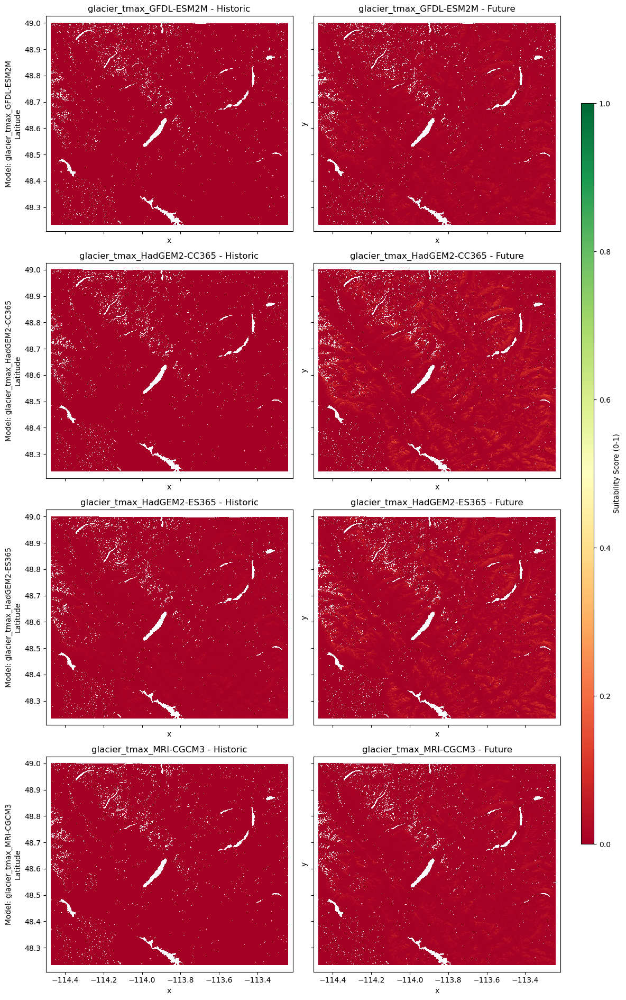

In [177]:
# test w/ glacier
# combine ensemble models and mean
# glacier_hist_ensemble = glac_hist_ensemble_suit.append(glac_hist_ensemble_mean)
# glacier_fut_ensemble = glac_fut_ensemble_suit.append(glac_fut_ensemble_mean)

# plot
plot_suitability_comparison(
    'glacier',
    glac_hist_ensemble_suit,
    glac_fut_ensemble_suit,
    vmin = 0,
    vmax = 1
    )

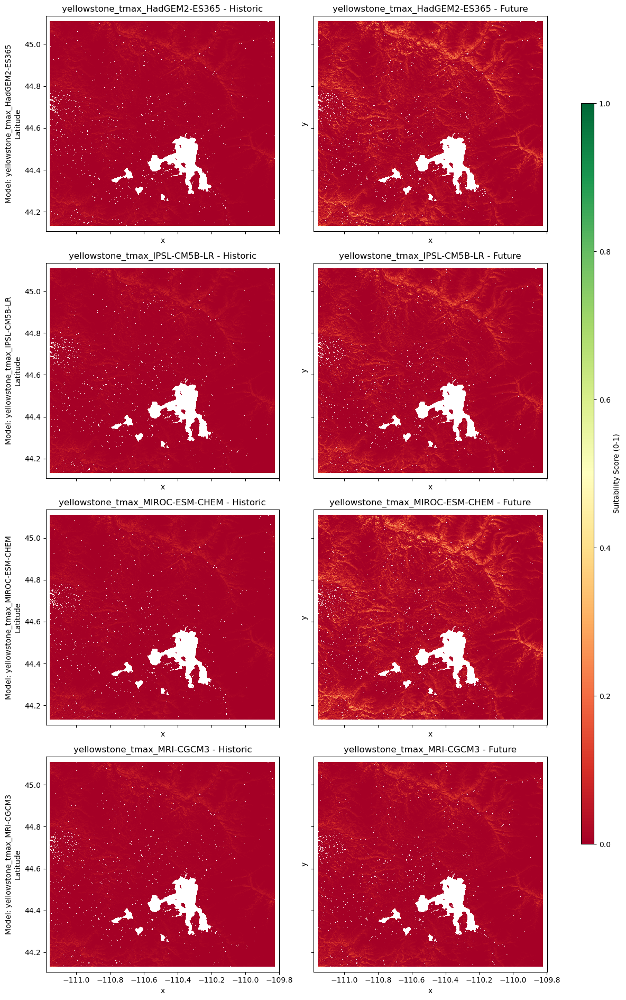

In [191]:
# Yellowstone
# combine ensemble models and mean
# yellowstone_hist_ensemble = ylst_hist_ensemble_suit.append(ylst_hist_ensemble_mean)
# yellowstone_fut_ensemble = ylst_fut_ensemble_suit.append(ylst_fut_ensemble_mean)

# plot
plot_suitability_comparison(
    'yellowstone',
    ylst_hist_ensemble_suit,
    ylst_fut_ensemble_suit,
    vmin = 0,
    vmax = 1
    )

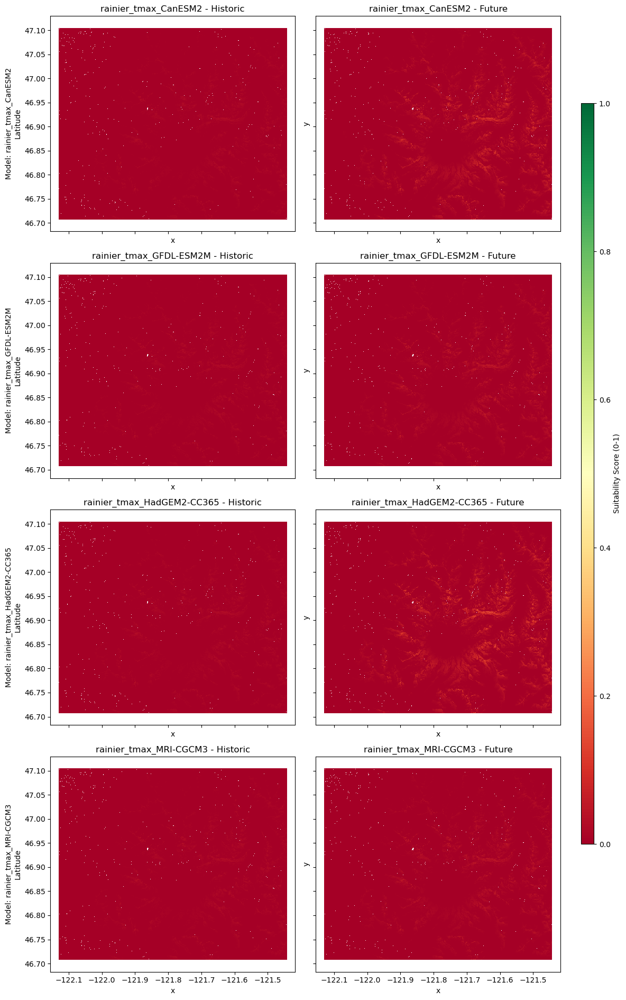

In [192]:
# Rainier
# combine ensemble models and mean
# rainier_hist_ensemble = rainier_hist_ensemble_suit.append(rainier_hist_ensemble_mean)
# rainier_fut_ensemble = rainier_fut_ensemble_suit.append(rainier_fut_ensemble_mean)

# plot
plot_suitability_comparison(
    'rainier',
    rainier_hist_ensemble_suit,
    rainier_fut_ensemble_suit,
    vmin = 0,
    vmax = 1
    )

Interpret your plots here:

All of the plots appear to lack any suitability at all. This likely indicates a problem with the processing, as Glacier and Yellowstone are obviously suitable in many places for the Whitebark Pine. Based on investigation, I believe this issue is related to how I imported the files at one point, and I plan to return and solve this issue.